<a href="https://colab.research.google.com/github/Akibu-nasir/osm_buildings_classification/blob/main/pushkinsky_build_type_predict.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install osmium pandas geopandas shapely osmnx numpy scikit-learn graphviz matplotlib jenkspy pyrosm --quiet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.5/2.5 MB 23.3 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.9/44.9 kB 3.4 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 62.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100.5/100.5 kB 8.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 650.9/650.9 kB 39.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 64.3 MB/s eta 0:00:00


In [ ]:
import osmium as osm
import pandas as pd
import geopandas
import os.path
import shapely.wkb as wkblib
wkbfab = osm.geom.WKBFactory()
import numpy as np
import shapely.geometry
import pyrosm
import os

from sklearn import tree
import graphviz
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn import metrics
from sklearn.model_selection import cross_val_predict
from sklearn import preprocessing
import jenkspy
from sklearn.metrics import PrecisionRecallDisplay

In [ ]:
class AreaHandler(osm.SimpleHandler):
    def __init__(self):
        osm.SimpleHandler.__init__(self)
        self.num_polys = 0
        self.osm_data = []
        self.roads_data = []
        self.landuse_data = []
        self.amenity_data = []

    def count_polygons(self):
        self.num_polys += 1

    def way(self, w):
        try:
            wkb = wkbfab.create_linestring(w)
            line = wkblib.loads(wkb, hex=True)
            for tag in w.tags:
                if (tag.k=='highway'):
                    self.roads_data.append([w.id,
                                       tag.v,
                                       line])
        except Exception:
            pass

    def area(self, a):
        try:
            wkb = wkbfab.create_multipolygon(a)
            self.count_polygons()
            # load into shapely
            poly = wkblib.loads(wkb, hex=True)
            for tag in a.tags:
                if (tag.k=='building'):
                    self.osm_data.append([a.id,
                                    tag.v,
                                    list(poly.geoms)[0],
                                    list(dict(a.tags).keys()),
                                    dict(a.tags)])
                if (tag.k=='landuse'):
                    self.landuse_data.append([tag.v,
                                    list(poly.geoms)[0],
                                    ])
                if (tag.k == 'amenity'):
                    self.amenity_data.append([tag.v,
                                    list(poly.geoms)[0],
                                    ])
        except Exception:
            pass

In [ ]:
import osmnx as ox
import geopandas as gpd

# Configure OSMnx (keep as is)
ox.settings.log_console = True
ox.settings.cache_folder = "./osmnx_cache"
ox.settings.use_cache = True

query = "Pushkinsky District, Saint Petersburg, Russia"
area_polygon = ox.geocode_to_gdf(query).geometry.iloc[0]

# Download building footprints
push_buildings = ox.features_from_polygon(
    area_polygon,
        tags={"building": True}
        )

        # Filter only polygons (exclude points, lines)
push_buildings = push_buildings[push_buildings.geom_type.isin(["Polygon", "MultiPolygon"])]


cols = ["name", "addr:street", "addr:housenumber", "building", "geometry"]
push_buildings = push_buildings[cols].reset_index(drop=True)

print(f"Downloaded {len(push_buildings)} buildings")

print(push_buildings['building'].unique())
print(push_buildings['building'].value_counts())

push_buildings.to_file("vasilievsky_island_buildings.geojson", driver="GeoJSON")
push_buildings.to_file("vasilievsky_island_buildings.shp")


Downloaded 21286 buildings
['school' 'government' 'dormitory' 'yes' 'community_centre' 'apartments'
 'castle' 'stable' 'palace' 'hospital' 'museum' 'mansion' 'university'
 'roof' 'retail' 'commercial' 'gazebo' 'warehouse' 'train_station'
 'service' 'kiosk' 'chapel' 'tower' 'cathedral' 'bath' 'garage' 'hangar'
 'industrial' 'kindergarten' 'house' 'triumphal_arch' 'garages'
 'greenhouse' 'shed' 'detached' 'church' 'fire_station' 'civic' 'clinic'
 'parking' 'construction' 'gate' 'guardhouse' 'ruins' 'no' 'residential'
 'office' 'policlinic' 'hotel' 'toilets' 'public' 'store' 'bunker'
 'college' 'manufacture' 'semidetached_house' 'bell_tower' 'fuel'
 'terrace' 'water_tower' 'collapsed' 'temple' 'pavilion' 'farm_auxiliary'
 'bridge' 'carport' 'storage_tank' 'container' 'marquee' 'allotment_house'
 'tent' 'sports_centre' 'grandstand' 'static_caravan']
building
yes               13554
house              2633
apartments         1310
detached            765
greenhouse          536
             

/tmp/ipython-input-8-2807306924.py:31: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  push_buildings.to_file("vasilievsky_island_buildings.shp")
/usr/local/lib/python3.11/dist-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'addr:street' to 'addr_stree'
  ogr_write(
/usr/local/lib/python3.11/dist-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'addr:housenumber' to 'addr_house'
  ogr_write(


In [ ]:
push_buildings.head()

,name,addr:street,addr:housenumber,building,geometry
0,NaN,улица Генерала Хазова,18,school,"POLYGON ((30.40963 59.73861, 30.40961 59.73894..."
1,администрация Пушкинского района,Октябрьский бульвар,24,government,"POLYGON ((30.41764 59.72223, 30.41764 59.72223..."
2,Общежитие №3 СПбГАУ,Средняя улица,6/1,dormitory,"POLYGON ((30.39905 59.7193, 30.39847 59.71884,..."
3,NaN,Малая улица,6,yes,"POLYGON ((30.39665 59.72106, 30.39709 59.72139..."
4,NaN,Школьная улица,2 литА,community_centre,"POLYGON ((30.40214 59.72906, 30.40278 59.72887..."


In [ ]:
!pip install folium matplotlib mapclassify --quiet
push_buildings.explore()

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 286.7/286.7 kB 4.4 MB/s eta 0:00:00


In [ ]:
push_buildings.to_file("pushkinsky_district_buildings.shp")

/tmp/ipython-input-11-3369004280.py:1: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  push_buildings.to_file("pushkinsky_district_buildings.shp")
/usr/local/lib/python3.11/dist-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'addr:street' to 'addr_stree'
  ogr_write(
/usr/local/lib/python3.11/dist-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'addr:housenumber' to 'addr_house'
  ogr_write(


In [ ]:
# load official buildings
buildings_path = "/content/pushkinsky_district_buildings.shp"
official_buildings = geopandas.read_file(buildings_path)

In [ ]:
official_buildings.shape

(21286, 5)

In [ ]:
official_buildings.columns

Index(['name', 'addr_stree', 'addr_house', 'building', 'geometry'], dtype='object')

In [ ]:
official_buildings = official_buildings.rename(columns={'building': 'official_type',})

In [ ]:
official_buildings.head()

,name,addr_stree,addr_house,official_type,geometry
0,None,улица Генерала Хазова,18,school,"POLYGON ((30.40963 59.73861, 30.40961 59.73894..."
1,администрация Пушкинского района,Октябрьский бульвар,24,government,"POLYGON ((30.41764 59.72223, 30.41764 59.72223..."
2,Общежитие №3 СПбГАУ,Средняя улица,6/1,dormitory,"POLYGON ((30.39905 59.7193, 30.39847 59.71884,..."
3,None,Малая улица,6,yes,"POLYGON ((30.39665 59.72106, 30.39709 59.72139..."
4,None,Школьная улица,2 литА,community_centre,"POLYGON ((30.40214 59.72906, 30.40278 59.72887..."


In [ ]:
official_buildings.groupby(['official_type']).count()

,name,addr_stree,addr_house,geometry
official_type,,,,
allotment_house,0,0,0,80
apartments,21,1267,1306,1310
bath,2,1,1,2
bell_tower,1,0,0,1
bridge,0,0,0,3
...,...,...,...,...
triumphal_arch,1,1,1,1
university,2,8,8,10
warehouse,6,53,54,67


In [ ]:
#dissolved_buildings = official_buildings.dissolve()

In [ ]:
#dissolved_buildings.bounds

In [ ]:
official_buildings.head()

,name,addr_stree,addr_house,official_type,geometry
0,None,улица Генерала Хазова,18,school,"POLYGON ((30.40963 59.73861, 30.40961 59.73894..."
1,администрация Пушкинского района,Октябрьский бульвар,24,government,"POLYGON ((30.41764 59.72223, 30.41764 59.72223..."
2,Общежитие №3 СПбГАУ,Средняя улица,6/1,dormitory,"POLYGON ((30.39905 59.7193, 30.39847 59.71884,..."
3,None,Малая улица,6,yes,"POLYGON ((30.39665 59.72106, 30.39709 59.72139..."
4,None,Школьная улица,2 литА,community_centre,"POLYGON ((30.40214 59.72906, 30.40278 59.72887..."


In [ ]:
official_buildings.groupby('official_type').count()

,name,addr_stree,addr_house,geometry
official_type,,,,
allotment_house,0,0,0,80
apartments,21,1267,1306,1310
bath,2,1,1,2
bell_tower,1,0,0,1
bridge,0,0,0,3
...,...,...,...,...
triumphal_arch,1,1,1,1
university,2,8,8,10
warehouse,6,53,54,67


In [ ]:
drop_list = ['Agricultural','Foundation/Ruin','Garage/Shed','Misc','Parking Structure','Tank', 'shed']
official_buildings.drop(official_buildings[(official_buildings['official_type'].isin(drop_list))].index,\
                        inplace = True)
official_buildings.reset_index(inplace=True, drop=True)

In [ ]:
official_buildings.head()

,name,addr_stree,addr_house,official_type,geometry
0,None,улица Генерала Хазова,18,school,"POLYGON ((30.40963 59.73861, 30.40961 59.73894..."
1,администрация Пушкинского района,Октябрьский бульвар,24,government,"POLYGON ((30.41764 59.72223, 30.41764 59.72223..."
2,Общежитие №3 СПбГАУ,Средняя улица,6/1,dormitory,"POLYGON ((30.39905 59.7193, 30.39847 59.71884,..."
3,None,Малая улица,6,yes,"POLYGON ((30.39665 59.72106, 30.39709 59.72139..."
4,None,Школьная улица,2 литА,community_centre,"POLYGON ((30.40214 59.72906, 30.40278 59.72887..."


In [ ]:
official_buildings.shape

(21212, 5)

In [ ]:
official_buildings.groupby('official_type').count()

,name,addr_stree,addr_house,geometry
official_type,,,,
allotment_house,0,0,0,80
apartments,21,1267,1306,1310
bath,2,1,1,2
bell_tower,1,0,0,1
bridge,0,0,0,3
...,...,...,...,...
triumphal_arch,1,1,1,1
university,2,8,8,10
warehouse,6,53,54,67


In [ ]:
# load official buildings
buildings_path = "/content/pushkinsky_district_buildings.shp"
official_buildings = geopandas.read_file(buildings_path)
official_buildings = official_buildings.rename(columns={'building': 'official_type',})

#drop_list = ['Agricultural','Foundation/Ruin','Garage/Shed','Misc','Parking Structure','Tank', 'shed']
#official_buildings.drop(official_buildings[(official_buildings['official_type'].isin(drop_list))].index,\
                        #inplace = True)

official_buildings['official_type'] = official_buildings['official_type'].apply(
    lambda x: 'RES' if (str(x).lower() == 'residential' or str(x).lower() == 'apartment') else 'NON_RES'
)

In [ ]:
official_buildings.groupby('official_type').count()

,name,addr_stree,addr_house,geometry
official_type,,,,
NON_RES,465,8530,7489,21202
RES,2,74,76,84


In [ ]:
areahandler = AreaHandler()
areahandler.apply_file("/content/drive/MyDrive/Pushkinsky_district.osm.pbf", locations=True)
print("Number of polygons: %d" % areahandler.num_polys)

Number of polygons: 35348


In [ ]:
len(areahandler.osm_data)

21281

In [ ]:
# transform the list into a pandas DataFrame
data_colnames = ['id', 'building', 'geometry', 'all_tag_keys', 'all_tags']
df = pd.DataFrame(areahandler.osm_data, columns=data_colnames)

In [ ]:
df.head()

,id,building,geometry,all_tag_keys,all_tags
0,64480866,apartments,"POLYGON ((30.4689751 59.7597286, 30.4691454 59...","[addr:city, addr:housenumber, addr:place, addr...","{'addr:city': 'Шушары', 'addr:housenumber': '1..."
1,64480972,apartments,"POLYGON ((30.4700565 59.7603782, 30.4713198 59...","[addr:city, addr:housenumber, addr:place, addr...","{'addr:city': 'Шушары', 'addr:housenumber': '8..."
2,64481228,apartments,"POLYGON ((30.4691673 59.7563603, 30.4701343 59...","[addr:city, addr:housenumber, addr:place, addr...","{'addr:city': 'Шушары', 'addr:housenumber': '2..."
3,69898164,apartments,"POLYGON ((30.4131395 59.7380105, 30.4131996 59...","[addr:city, addr:housenumber, addr:street, bui...","{'addr:city': 'Пушкин', 'addr:housenumber': '4..."
4,69922378,yes,"POLYGON ((30.3856783 59.7180108, 30.3858265 59...","[access, building, building:levels, historic, ...","{'access': 'no', 'building': 'yes', 'building:..."


In [ ]:
gdf = geopandas.GeoDataFrame(df, crs=4326, geometry='geometry')

In [ ]:
!pip install -Uq cartopy
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import Arrow
from matplotlib.offsetbox import AnchoredText
import cartopy.crs as ccrs
import cartopy.feature as cfeature

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.7/11.7 MB 95.3 MB/s eta 0:00:00


/usr/local/lib/python3.11/dist-packages/cartopy/mpl/feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


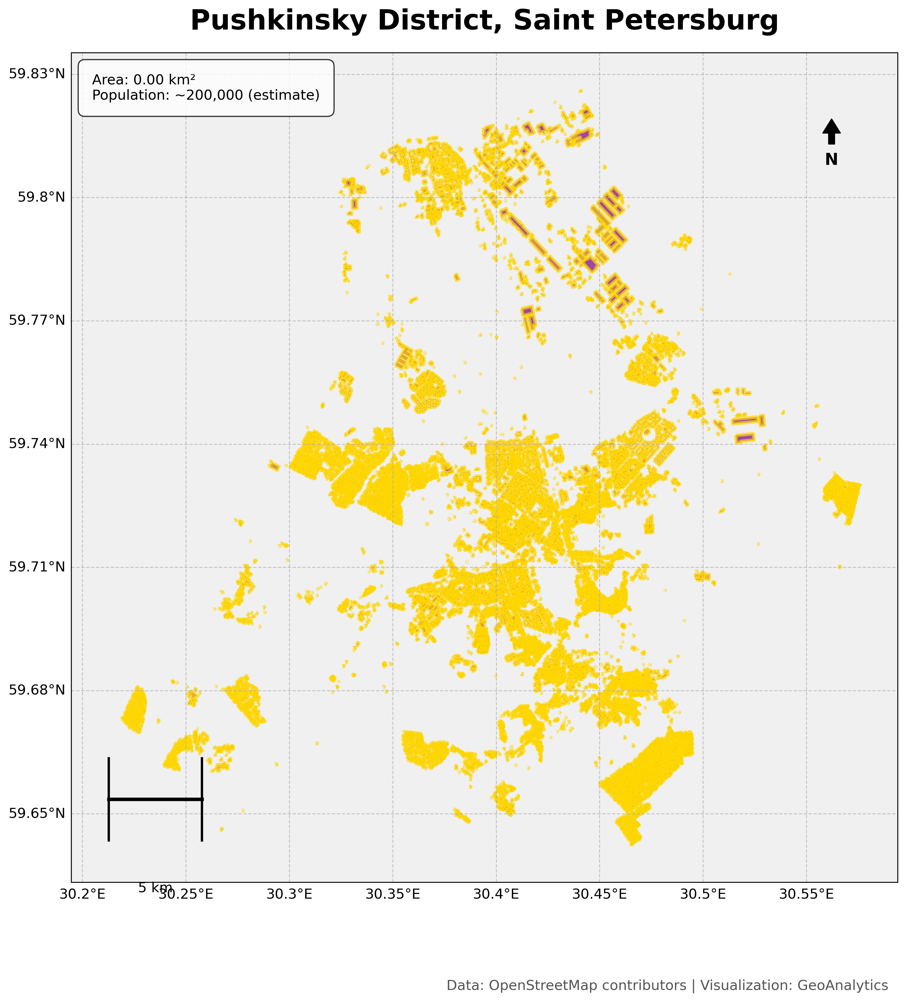

In [ ]:
# Create presentation-sized figure
fig = plt.figure(figsize=(16, 12), dpi=300)
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

# Plot the district with enhanced styling
gdf.plot(ax=ax, color='#800080', edgecolor='#FFD700', linewidth=3,
          alpha=0.7, zorder=2)

# Add contextual map features
ax.add_feature(cfeature.OCEAN.with_scale('10m'), zorder=0)
ax.add_feature(cfeature.LAND.with_scale('10m'), color='#f0f0f0', zorder=0)
ax.add_feature(cfeature.LAKES.with_scale('10m'), color='#c6e0ff', zorder=0)
ax.add_feature(cfeature.RIVERS.with_scale('10m'), color='#c6e0ff', zorder=0)
ax.add_feature(cfeature.BORDERS.with_scale('10m'), linestyle='--', zorder=1)

# Add gridlines and labels
gl = ax.gridlines(draw_labels=True, linestyle='--', alpha=0.7)
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 12}
gl.ylabel_style = {'size': 12}

# Add scale bar manually
def add_scale_bar(ax, length_km, location=(0.05, 0.05)):
    """Add a scale bar to the map"""
    # Get current axis limits
    xmin, xmax = ax.get_xlim()
    ymin, ymax = ax.get_ylim()

    # Calculate position in data coordinates
    x = xmin + (xmax - xmin) * location[0]
    y = ymin + (ymax - ymin) * location[1]

    # Calculate length in degrees (approx 111km per degree)
    length_deg = length_km / 111

    # Draw the scale bar
    ax.plot([x, x + length_deg], [y, y], color='black', linewidth=3,
            transform=ccrs.PlateCarree())
    ax.plot([x, x], [y - 0.01, y + 0.01], color='black', linewidth=2,
            transform=ccrs.PlateCarree())
    ax.plot([x + length_deg, x + length_deg], [y - 0.01, y + 0.01],
            color='black', linewidth=2, transform=ccrs.PlateCarree())

    # Add text label
    ax.text(x + length_deg/2, y - 0.02, f'{length_km} km',
            ha='center', va='top', fontsize=12, transform=ccrs.PlateCarree())

# Add north arrow
def add_north_arrow(ax, location=(0.92, 0.92)):
    """Add a north arrow to the map"""
    x, y = location
    ax.annotate('', xy=(x, y), xytext=(x, y - 0.03),
                arrowprops=dict(facecolor='black', width=5, headwidth=15),
                xycoords='axes fraction', ha='center', va='center')
    ax.text(x, y - 0.04, 'N', ha='center', va='top',
            fontsize=14, fontweight='bold', transform=ax.transAxes)

# Add map elements
add_scale_bar(ax, length_km=5, location=(0.03, 0.1))
add_north_arrow(ax, location=(0.92, 0.92))

# Add title and attribution
plt.title('Pushkinsky District, Saint Petersburg',
          fontsize=24, fontweight='bold', pad=20)
ax.annotate('Data: OpenStreetMap contributors | Visualization: GeoAnalytics',
            xy=(0.5, 0.01), xycoords='figure fraction',
            ha='center', fontsize=12, color='#555555')

text_box = AnchoredText(context_text, loc='upper left', frameon=True,
                       pad=0.5, borderpad=1, prop=dict(size=12))
text_box.patch.set_boxstyle("round,pad=0.5")
text_box.patch.set_facecolor('white')
text_box.patch.set_alpha(0.8)
ax.add_artist(text_box)

# Save and show
plt.tight_layout()
plt.savefig('Pushkinsky_District_Presentation.png',
            dpi=300, bbox_inches='tight', facecolor='white')
plt.show()

<Axes: >

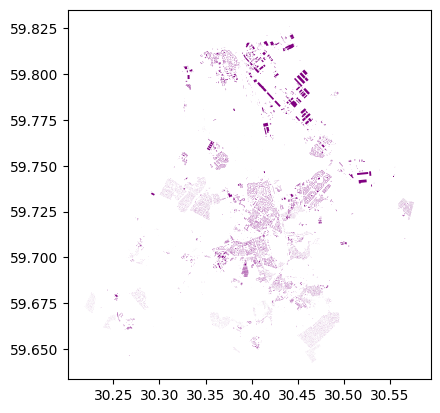

In [ ]:
gdf.plot(color='purple')

In [ ]:
gdf.head()

,id,building,geometry,all_tag_keys,all_tags
0,64480866,apartments,"POLYGON ((30.46898 59.75973, 30.46915 59.75966...","[addr:city, addr:housenumber, addr:place, addr...","{'addr:city': 'Шушары', 'addr:housenumber': '1..."
1,64480972,apartments,"POLYGON ((30.47006 59.76038, 30.47132 59.75985...","[addr:city, addr:housenumber, addr:place, addr...","{'addr:city': 'Шушары', 'addr:housenumber': '8..."
2,64481228,apartments,"POLYGON ((30.46917 59.75636, 30.47013 59.75595...","[addr:city, addr:housenumber, addr:place, addr...","{'addr:city': 'Шушары', 'addr:housenumber': '2..."
3,69898164,apartments,"POLYGON ((30.41314 59.73801, 30.4132 59.73789,...","[addr:city, addr:housenumber, addr:street, bui...","{'addr:city': 'Пушкин', 'addr:housenumber': '4..."
4,69922378,yes,"POLYGON ((30.38568 59.71801, 30.38583 59.71796...","[access, building, building:levels, historic, ...","{'access': 'no', 'building': 'yes', 'building:..."


In [ ]:
gdf.groupby('building').count().sort_values(by=['building'], inplace=False, ascending=True).tail(50)

,id,geometry,all_tag_keys,all_tags
building,,,,
garage,210,210,210,210
garages,204,204,204,204
gate,2,2,2,2
gazebo,4,4,4,4
government,5,5,5,5
grandstand,1,1,1,1
greenhouse,536,536,536,536
guardhouse,16,16,16,16
hangar,55,55,55,55


In [ ]:
# transform the list into a pandas DataFrame
land_colnames = ['landuse', 'geometry']
land_df = pd.DataFrame(areahandler.landuse_data, columns=land_colnames)

In [ ]:
land_df.shape

(5005, 2)

In [ ]:
land_df.head()

,landuse,geometry
0,farmland,"POLYGON ((30.3695152 59.7757825, 30.3782592 59..."
1,farmland,"POLYGON ((30.3126126 59.7120492, 30.3244143 59..."
2,farmland,"POLYGON ((30.2955645 59.6890119, 30.2966712 59..."
3,construction,"POLYGON ((30.321241 59.7529245, 30.3236467 59...."
4,farmland,"POLYGON ((30.4288611 59.7086869, 30.4296121 59..."


In [ ]:
land_df.groupby('landuse').count()

,geometry
landuse,
allotments,149
basin,3
brownfield,4
cemetery,15
commercial,38
construction,102
depot,1
farmland,138
farmyard,5


In [ ]:
non_res = ['commercial', 'retail','industrial','grass','plant_nursery','quarry','railway','government',\
            'institutional']
land_df['landuse'] = land_df['landuse'].apply(\
                                lambda x: 'non_res' if x in non_res else x)

In [ ]:
land_df.groupby('landuse').count()

,geometry
landuse,
brownfield,2
cemetery,4
construction,40
farmland,1
flowerbed,11
forest,47
garages,14
landfill,2
military,5


In [ ]:
land_gdf = geopandas.GeoDataFrame(land_df, crs=4326, geometry='geometry')

In [ ]:
gdf.shape

(21281, 5)

In [ ]:
land_gdf.shape

(5005, 2)

In [ ]:
buildings_land = gdf.sjoin(land_gdf, how="left", predicate='intersects')

In [ ]:
buildings_land.shape

(23506, 7)

In [ ]:
buildings_land.drop_duplicates(subset='id',inplace=True)

In [ ]:
buildings_land.shape

(4074, 7)

In [ ]:
buildings_land.head()

,id,building,geometry,all_tag_keys,all_tags,index_right,landuse
0,64480866,apartments,"POLYGON ((30.46898 59.75973, 30.46915 59.75966...","[addr:city, addr:housenumber, addr:place, addr...","{'addr:city': 'Шушары', 'addr:housenumber': '1...",4893.0,residential
1,64480972,apartments,"POLYGON ((30.47006 59.76038, 30.47132 59.75985...","[addr:city, addr:housenumber, addr:place, addr...","{'addr:city': 'Шушары', 'addr:housenumber': '8...",4893.0,residential
2,64481228,apartments,"POLYGON ((30.46917 59.75636, 30.47013 59.75595...","[addr:city, addr:housenumber, addr:place, addr...","{'addr:city': 'Шушары', 'addr:housenumber': '2...",4893.0,residential
3,69898164,apartments,"POLYGON ((30.41314 59.73801, 30.4132 59.73789,...","[addr:city, addr:housenumber, addr:street, bui...","{'addr:city': 'Пушкин', 'addr:housenumber': '4...",106.0,residential
4,69922378,yes,"POLYGON ((30.38568 59.71801, 30.38583 59.71796...","[access, building, building:levels, historic, ...","{'access': 'no', 'building': 'yes', 'building:...",4152.0,construction


In [ ]:
buildings_land.rename(columns={'index_right': 'index_landuse'},inplace=True)
buildings_land['landuse'] = \
            buildings_land['landuse'].apply(lambda x: 'no_landuse' if pd.isnull(x) else x)
buildings_land.reset_index(inplace=True, drop=True)

In [ ]:
buildings_land[buildings_land['landuse'] == 'no_landuse'].shape

(2321, 7)

In [ ]:
len(buildings_land.index_landuse.unique())

1958

In [ ]:
buildings_land.head()

,id,building,geometry,all_tag_keys,all_tags,index_landuse,landuse
0,64480866,apartments,"POLYGON ((30.46898 59.75973, 30.46915 59.75966...","[addr:city, addr:housenumber, addr:place, addr...","{'addr:city': 'Шушары', 'addr:housenumber': '1...",4893.0,residential
1,64480972,apartments,"POLYGON ((30.47006 59.76038, 30.47132 59.75985...","[addr:city, addr:housenumber, addr:place, addr...","{'addr:city': 'Шушары', 'addr:housenumber': '8...",4893.0,residential
2,64481228,apartments,"POLYGON ((30.46917 59.75636, 30.47013 59.75595...","[addr:city, addr:housenumber, addr:place, addr...","{'addr:city': 'Шушары', 'addr:housenumber': '2...",4893.0,residential
3,69898164,apartments,"POLYGON ((30.41314 59.73801, 30.4132 59.73789,...","[addr:city, addr:housenumber, addr:street, bui...","{'addr:city': 'Пушкин', 'addr:housenumber': '4...",106.0,residential
4,69922378,yes,"POLYGON ((30.38568 59.71801, 30.38583 59.71796...","[access, building, building:levels, historic, ...","{'access': 'no', 'building': 'yes', 'building:...",4152.0,construction


In [ ]:
buildings_land.groupby('landuse').count()

,id,building,geometry,all_tag_keys,all_tags,index_landuse
landuse,,,,,,
allotments,5486,5486,5486,5486,5486,5486
brownfield,8,8,8,8,8,8
cemetery,25,25,25,25,25,25
construction,137,137,137,137,137,137
depot,1,1,1,1,1,1
farmland,25,25,25,25,25,25
farmyard,26,26,26,26,26,26
forest,3,3,3,3,3,3
garages,249,249,249,249,249,249


In [ ]:
buildings_land.groupby(['landuse','building']).count().head(5)

id  geometry  all_tag_keys  all_tags  \
landuse    building                                                  
allotments allotment_house    79        79            79        79   
           construction        2         2             2         2   
           detached           26        26            26        26   
           greenhouse         12        12            12        12   
           house            1017      1017          1017      1017   

                            index_landuse  
landuse    building                        
allotments allotment_house             79  
           construction                 2  
           detached                    26  
           greenhouse                  12  
           house                     1017

In [ ]:
buildings_land['land_building'] = buildings_land.apply(lambda x: \
    x['landuse'] if x['building'] == 'yes' else x['building'], axis=1)

In [ ]:
buildings_land.groupby(['landuse','land_building']).count().head(50)

id  building  geometry  all_tag_keys  \
landuse      land_building                                             
allotments   allotment_house    79        79        79            79   
             allotments       4343      4343      4343          4343   
             construction        2         2         2             2   
             detached           26        26        26            26   
             greenhouse         12        12        12            12   
             house            1017      1017      1017          1017   
             residential         5         5         5             5   
             stable              2         2         2             2   
brownfield   brownfield          8         8         8             8   
cemetery     cemetery           20        20        20            20   
             church              1         1         1             1   
             garages             3         3         3             3   
             ruins               1         1         1             1   
construction apartments          2         2         2             2   
             church              1         1         1             1   
             construction      117       117       117           117   
             gazebo              2         2         2             2   
             house               1         1         1             1   
             industrial          1         1         1             1   
             no                  1         1         1             1   
             palace              1         1         1             1   
             school              1         1         1             1   
             service             4         4         4             4   
             shed                3         3         3             3   
             tower               3         3         3             3   
depot        depot               1         1         1             1   
farmland     farmland           25        25        25            25   
farmyard     farm_auxiliary      2         2         2             2   
             farmyard           23        23        23            23   
             service             1         1         1             1   
forest       forest              3         3         3             3   
garages      garage             43        43        43            43   
             garages           206       206       206           206   
meadow       construction        1         1         1             1   
             kiosk               3         3         3             3   
             meadow             12        12        12            12   
             ruins               1         1         1             1   
             shed                1         1         1             1   
             tower               1         1         1             1   
military     apartments          6         6         6             6   
             commercial          1         1         1             1   
             dormitory           1         1         1             1   
             garages             3         3         3             3   
             guardhouse          1         1         1             1   
             hangar             24        24        24            24   
             military          376       376       376           376   
             residential         1         1         1             1   
             ruins               2         2         2             2   
             service             1         1         1             1   
             warehouse           2         2         2             2   

                              all_tags  index_landuse  
landuse      land_building                             
allotments   allotment_house        79             79  
             allotments           4343           4343  
             construction            2              2  
       

In [ ]:
def enrich_buildings(buildings_land,tags_list):
    for tag_val in tags_list:
        buildings_land['land_building'] = buildings_land.apply(lambda x: \
            tag_val if x['landuse'] == tag_val else x['land_building'], axis=1)

    return buildings_land

In [ ]:
tags_list = ['residential','commercial','religious','recreation_ground','cemetery',\
            'construction','farmland','farmyard','forest','military']
buildings_land = enrich_buildings(buildings_land,tags_list)

In [ ]:
buildings_land.groupby(['landuse','land_building']).count().head(5)

id  building  geometry  all_tag_keys  all_tags  \
landuse    land_building                                                       
allotments allotment_house    79        79        79            79        79   
           allotments       4343      4343      4343          4343      4343   
           construction        2         2         2             2         2   
           detached           26        26        26            26        26   
           greenhouse         12        12        12            12        12   

                            index_landuse  
landuse    land_building                   
allotments allotment_house             79  
           allotments                4343  
           construction                 2  
           detached                    26  
           greenhouse                  12

In [ ]:
buildings_land.groupby(['land_building']).count().head(50)

,id,building,geometry,all_tag_keys,all_tags,index_landuse,landuse
land_building,,,,,,,
apartments,44,44,44,44,44,40,44
bridge,2,2,2,2,2,2,2
cemetery,21,21,21,21,21,21,21
chapel,2,2,2,2,2,0,2
civic,1,1,1,1,1,0,1
college,2,2,2,2,2,1,2
commercial,27,27,27,27,27,22,27
construction,49,49,49,49,49,49,49
depot,4,4,4,4,4,4,4


In [ ]:
buildings_land.shape

(21281, 8)

In [ ]:
official_buildings.shape

(21286, 5)

In [ ]:
official_buildings.crs

In [ ]:
buildings_gdf = buildings_land.sjoin(official_buildings, how="inner", predicate='intersects')
buildings_gdf.rename(columns={'index_right': 'index_official'}, inplace=True)

In [ ]:
buildings_gdf.shape

(22588, 13)

In [ ]:
buildings_gdf

,id,building,geometry,all_tag_keys,all_tags,index_landuse,landuse,land_building,index_official,name,addr_stree,addr_house,official_type
0,64480866,apartments,"POLYGON ((30.46898 59.75973, 30.46915 59.75966...","[addr:city, addr:housenumber, addr:place, addr...","{'addr:city': 'Шушары', 'addr:housenumber': '1...",4893.0,residential,residential,761,None,None,10,NON_RES
1,64480972,apartments,"POLYGON ((30.47006 59.76038, 30.47132 59.75985...","[addr:city, addr:housenumber, addr:place, addr...","{'addr:city': 'Шушары', 'addr:housenumber': '8...",4893.0,residential,residential,762,None,None,8,NON_RES
2,64481228,apartments,"POLYGON ((30.46917 59.75636, 30.47013 59.75595...","[addr:city, addr:housenumber, addr:place, addr...","{'addr:city': 'Шушары', 'addr:housenumber': '2...",4893.0,residential,residential,763,None,None,22,NON_RES
3,69898164,apartments,"POLYGON ((30.41314 59.73801, 30.4132 59.73789,...","[addr:city, addr:housenumber, addr:street, bui...","{'addr:city': 'Пушкин', 'addr:housenumber': '4...",106.0,residential,residential,764,None,улица Генерала Хазова,43,NON_RES
4,69922378,yes,"POLYGON ((30.38568 59.71801, 30.38583 59.71796...","[access, building, building:levels, historic, ...","{'access': 'no', 'building': 'yes', 'building:...",4152.0,construction,construction,765,Китайский театр,None,None,NON_RES
...,...,...,...,...,...,...,...,...,...,...,...,...,...
21276,2771324722,kiosk,"POLYGON ((30.38709 59.72532, 30.38714 59.72531...","[amenity, building, building:colour, height, n...","{'amenity': 'fast_food', 'building': 'kiosk', ...",NaN,no_landuse,kiosk,21280,Чешский трдельник,None,None,NON_RES
21277,2776640764,roof,"POLYGON ((30.44404 59.68466, 30.44412 59.68463...","[building, layer]","{'building': 'roof', 'layer': '1'}",NaN,no_landuse,roof,21281,None,None,None,NON_RES
21278,2776640766,roof,"POLYGON ((30.44415 59.68489, 30.44423 59.68485...","[building, layer]","{'building': 'roof', 'layer': '1'}",NaN,no_landuse,roof,21282,None,None,None,NON_RES
21279,2776640768,roof,"POLYGON ((30.43997 59.68125, 30.44005 59.68115...","[building, layer]","{'building': 'roof', 'layer': '1'}",5002.0,non_res,roof,21283,None,None,None,NON_RES


In [ ]:
buildings_gdf.drop_duplicates(subset='id',inplace=True)

In [ ]:
buildings_gdf.shape

(21280, 13)

In [ ]:
#buildings_gdf = official_buildings.sjoin(gdf, how="inner", predicate='intersects')
#buildings_gdf = official_buildings.sjoin(buildings_land, how="inner", predicate='intersects')
#buildings_gdf = official_buildings.sjoin(buildings_land_parking, how="inner", predicate='intersects')
#buildings_gdf.rename(columns={'index_right': 'index_buildings'}, inplace=True)

In [ ]:
#buildings_gdf.shape

In [ ]:
#buildings_gdf.drop_duplicates(subset='OBJECTID',inplace=True)

In [ ]:
#buildings_gdf.shape

In [ ]:
#buildings_gdf

In [ ]:
#buildings_gdf.shape

In [ ]:
#buildings_gdf.head()

In [ ]:
buildings_gdf.groupby(['landuse','land_building','official_type',]).count().head(50)

id  building  geometry  \
landuse         land_building    official_type                             
allotments      allotment_house  NON_RES          79        79        79   
                allotments       NON_RES        4343      4343      4343   
                construction     NON_RES           2         2         2   
                detached         NON_RES          26        26        26   
                greenhouse       NON_RES          12        12        12   
                house            NON_RES        1017      1017      1017   
                residential      RES               5         5         5   
                stable           NON_RES           2         2         2   
brownfield      brownfield       NON_RES           8         8         8   
cemetery        cemetery         NON_RES          25        25        25   
construction    construction     NON_RES         137       137       137   
depot           depot            NON_RES           1         1         1   
farmland        farmland         NON_RES          25        25        25   
farmyard        farmyard         NON_RES          26        26        26   
forest          forest           NON_RES           3         3         3   
garages         garage           NON_RES          43        43        43   
                garages          NON_RES         206       206       206   
meadow          construction     NON_RES           1         1         1   
                kiosk            NON_RES           3         3         3   
                meadow           NON_RES          12        12        12   
                ruins            NON_RES           1         1         1   
                shed             NON_RES           1         1         1   
                tower            NON_RES           1         1         1   
military        military         NON_RES         417       417       417   
                                 RES               1         1         1   
natural_reserve natural_reserve  NON_RES           3         3         3   
no_landuse      apartments       NON_RES          49        49        49   
                bath             NON_RES           2         2         2   
                bell_tower       NON_RES           1         1         1   
                bridge           NON_RES           1         1         1   
                bunker           NON_RES           4         4         4   
                carport          NON_RES           2         2         2   
                cathedral        NON_RES           1         1         1   
                chapel           NON_RES           1         1         1   
                church           NON_RES          14        14        14   
                civic            NON_RES           1         1         1   
                clinic           NON_RES           1         1         1   
                collapsed        NON_RES           2         2         2   
                college          NON_RES           2         2         2   
                commercial       NON_RES          19        19        19   
                community_centre NON_RES           1         1         1   
                construction     NON_RES           6         6         6   
                container        NON_RES           3         3         3   
                detached         NON_RES           6         6         6   
                dormitory        NON_RES           9         9         9   
                farm_auxiliary   NON_RES           3         3         3   
                fire_station     NON_RES           1         1         1   
                fuel             NON_RES           1         1         1   
                garage           NON_RES          35        35        35   
                garages          NON_RES           3         3         3   

                                                all_tag_keys  all_tags  \
landuse         land_bu

In [ ]:
buildings_gdf.groupby(['landuse','land_building','official_type',]).count().tail(10)

id  building  geometry  \
landuse     land_building official_type                              
non_res     water_tower   NON_RES            2         2         2   
orchard     carport       NON_RES            1         1         1   
            greenhouse    NON_RES            5         5         5   
            orchard       NON_RES            7         7         7   
            retail        NON_RES            1         1         1   
            toilets       NON_RES            1         1         1   
religious   religious     NON_RES           21        21        21   
residential residential   NON_RES        10615     10615     10615   
                          RES               72        72        72   
vineyard    palace        NON_RES            1         1         1   

                                         all_tag_keys  all_tags  \
landuse     land_building official_type                           
non_res     water_tower   NON_RES                   2         2   
orchard     carport       NON_RES                   1         1   
            greenhouse    NON_RES                   5         5   
            orchard       NON_RES                   7         7   
            retail        NON_RES                   1         1   
            toilets       NON_RES                   1         1   
religious   religious     NON_RES                  21        21   
residential residential   NON_RES               10615     10615   
                          RES                      72        72   
vineyard    palace        NON_RES                   1         1   

                                         index_landuse  index_official  name  \
landuse     land_building official_type                                        
non_res     water_tower   NON_RES                    2               2     0   
orchard     carport       NON_RES                    1               1     0   
            greenhouse    NON_RES                    5               5     0   
            orchard       NON_RES                    7               7     0   
            retail        NON_RES                    1               1     0   
            toilets       NON_RES                    1               1     0   
religious   religious     NON_RES                   21              21     9   
residential residential   NON_RES                10615           10615    90   
                          RES                       72              72     0   
vineyard    palace        NON_RES                    1               1     1   

                                         addr_stree  addr_house  
landuse     land_building official_type                          
non_res     water_tower   NON_RES                 0           0  
orchard     carport       NON_RES                 0           0  
            greenhouse    NON_RES                 0           0  
            orchard       NON_RES                 0           0  
            retail        NON_RES                 0           0  
            toilets       NON_RES                 0           0  
religious   religious     NON_RES                11          10  
residential residential   NON_RES              5589        5572  
                          RES                    67          68  
vineyard    palace        NON_RES                 1           1

In [ ]:
# lookup all rows of above buildings_gdf.groupby(['landuse','land_building','official_type',]).count()

In [ ]:
len(areahandler.roads_data)

23193

In [ ]:
# transform the list of roads into a pandas DataFrame
roads_colnames = ['id', 'highway', 'geometry']
roads_df = pd.DataFrame(areahandler.roads_data, columns=roads_colnames)

In [ ]:
roads_df.head()

,id,highway,geometry
0,4414959,residential,"LINESTRING (30.4193716 59.7310274, 30.4190097 ..."
1,4414960,residential,"LINESTRING (30.4196152 59.728299, 30.4198857 5..."
2,4414988,secondary,"LINESTRING (30.4085217 59.7136071, 30.4086916 ..."
3,4456239,secondary,"LINESTRING (30.3946831 59.7284988, 30.3946973 ..."
4,4460441,trunk,"LINESTRING (30.3702887 59.8152076, 30.3691184 ..."


In [ ]:
roads_df.shape

(23193, 3)

In [ ]:
road_categories = roads_df.groupby(['highway'])['id'].count().reset_index(name="count")

In [ ]:
road_categories

,highway,count
0,bus_stop,28
1,construction,59
2,corridor,2
3,cycleway,10
4,footway,9590
5,living_street,23
6,motorway,81
7,motorway_link,23
8,no,4
9,path,1655


In [ ]:
roads_cat1 = roads_df[(roads_df['highway'] == 'residential') | (roads_df['highway'] == 'living_street')]

In [ ]:
roads_cat1 = roads_cat1.assign(highway='residential')

In [ ]:
roads_cat1.shape

(918, 3)

In [ ]:
roads_cat1.groupby('highway').count()

,id,geometry
highway,,
residential,918,918


In [ ]:
roads_cat1 = geopandas.GeoDataFrame(roads_cat1,crs="EPSG:4326",geometry='geometry')

In [ ]:
roads_list = ['primary', 'secondary','tertiary']
roads_cat2 = roads_df[roads_df['highway'].isin(roads_list)]

In [ ]:
roads_cat2 = roads_cat2.assign(highway='non_res_road')

In [ ]:
roads_cat2.shape

(942, 3)

In [ ]:
roads_cat2.groupby('highway').count()

,id,geometry
highway,,
non_res_road,942,942


In [ ]:
roads_cat2 = geopandas.GeoDataFrame(roads_cat2,crs="EPSG:4326",geometry='geometry')

In [ ]:
roads_cat3 = roads_df[(roads_df['highway'] == 'motorway') | (roads_df['highway'] == 'trunk')]

In [ ]:
roads_cat3 = roads_cat3.assign(highway='roads_cat3')

In [ ]:
roads_cat3.shape

(243, 3)

In [ ]:
roads_cat3.groupby('highway').count()

,id,geometry
highway,,
roads_cat3,243,243


In [ ]:
roads_cat3 = geopandas.GeoDataFrame(roads_cat3,crs="EPSG:4326",geometry='geometry')

In [ ]:
roads_cat4 = roads_df[(roads_df['highway'] == 'service')]

In [ ]:
roads_cat4.shape

(8391, 3)

In [ ]:
roads_cat4.groupby('highway').count()

,id,geometry
highway,,
service,8391,8391


In [ ]:
roads_cat4 = geopandas.GeoDataFrame(roads_cat4,crs="EPSG:4326",geometry='geometry')

In [ ]:
def apply_buffers(radius, road_category):
    road_category['geometry'] = road_category['geometry'].to_crs(epsg=32610).buffer(radius)
    road_category.to_crs(epsg=4326, inplace=True)
    road_category.rename(columns={'highway': 'buffered_highway'}, inplace=True)
    road_category = road_category.dissolve()

    return road_category

In [ ]:
# approx in meters unit: 1 decimal degree equals 111.32 km
#radius_list = [0.00027,0.00054,0.00081]
radius_list = [30,60,90]                        # meters
road_category = roads_cat1.copy()
buffered_cat1_30 = apply_buffers(radius_list[0],road_category)
buffered_cat1_60 = apply_buffers(radius_list[1],road_category)
buffered_cat1_90 = apply_buffers(radius_list[2],road_category)

road_category = roads_cat2.copy()
buffered_cat2_30 = apply_buffers(radius_list[0],road_category)
buffered_cat2_60 = apply_buffers(radius_list[1],road_category)
buffered_cat2_90 = apply_buffers(radius_list[2],road_category)

road_category = roads_cat3.copy()
buffered_cat3_30 = apply_buffers(radius_list[0],road_category)
buffered_cat3_60 = apply_buffers(radius_list[1],road_category)
buffered_cat3_90 = apply_buffers(radius_list[2],road_category)

road_category = roads_cat4.copy()
buffered_cat4_30 = apply_buffers(radius_list[0],road_category)
buffered_cat4_60 = apply_buffers(radius_list[1],road_category)
buffered_cat4_90 = apply_buffers(radius_list[2],road_category)

<Axes: >

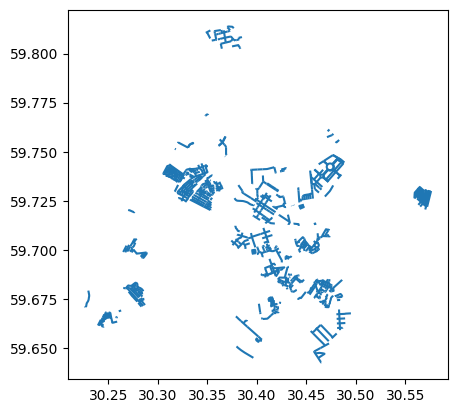

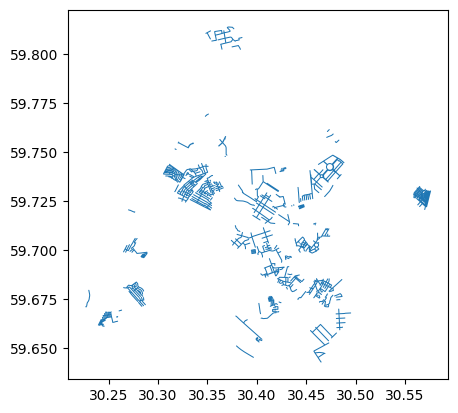

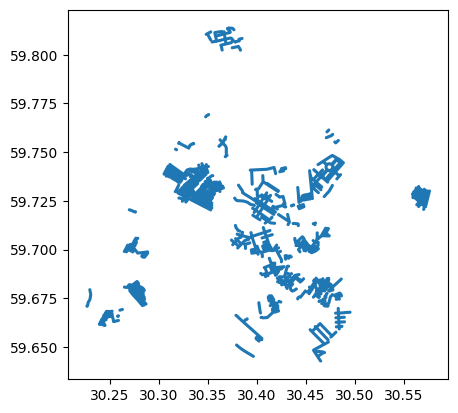

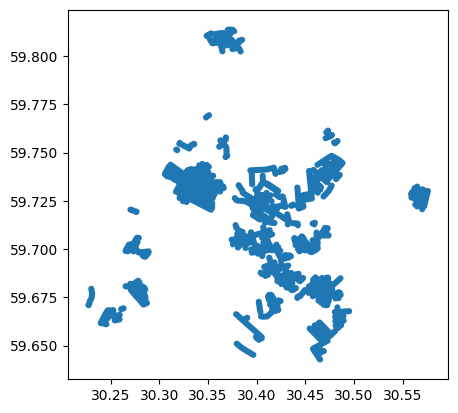

In [ ]:
roads_cat1.plot()
buffered_cat1_30.plot()
buffered_cat1_60.plot()
buffered_cat1_90.plot()

<Axes: >

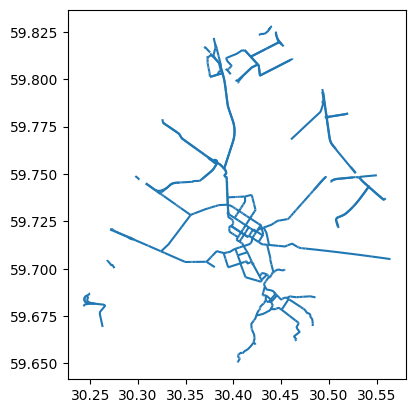

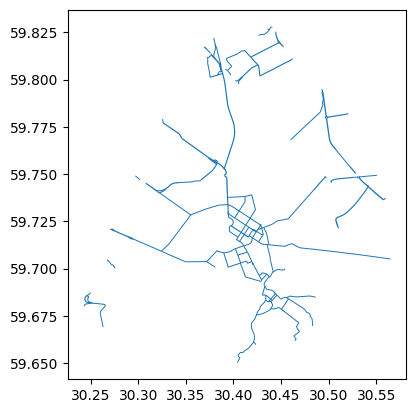

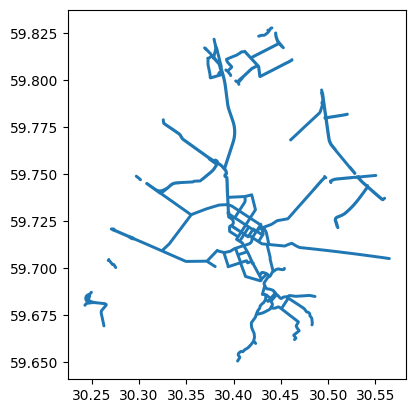

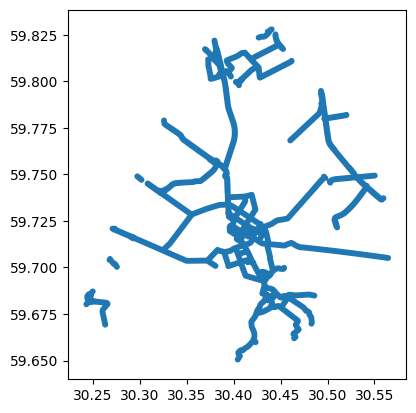

In [ ]:
roads_cat2.plot()
buffered_cat2_30.plot()
buffered_cat2_60.plot()
buffered_cat2_90.plot()

<Axes: >

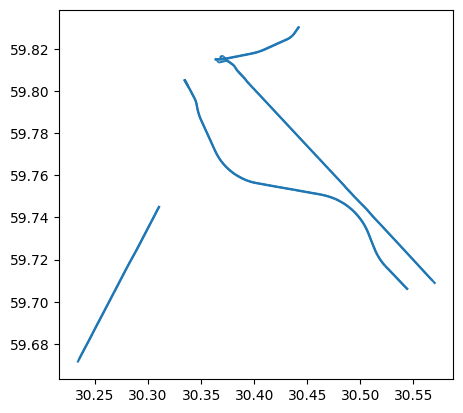

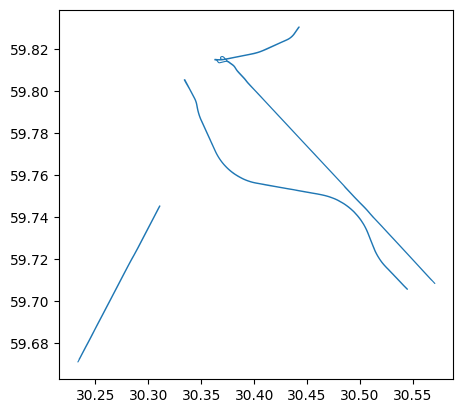

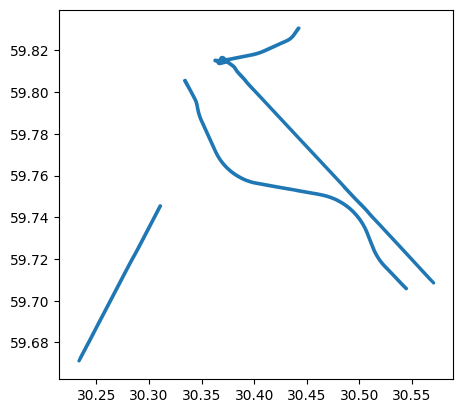

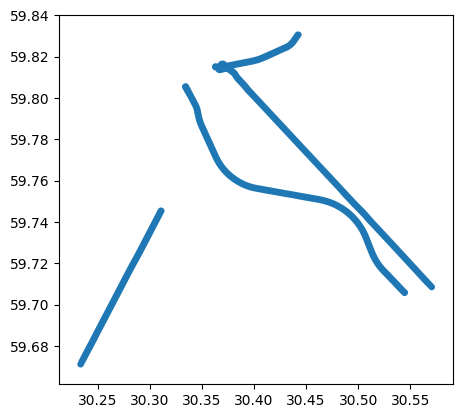

In [ ]:
roads_cat3.plot()
buffered_cat3_30.plot()
buffered_cat3_60.plot()
buffered_cat3_90.plot()

<Axes: >

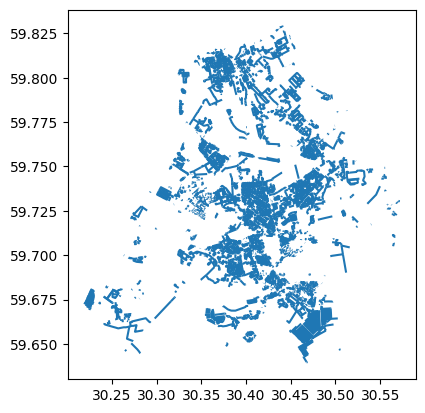

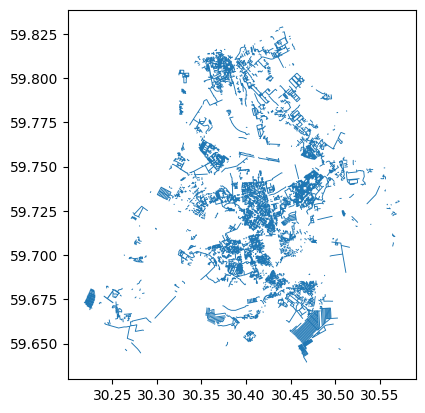

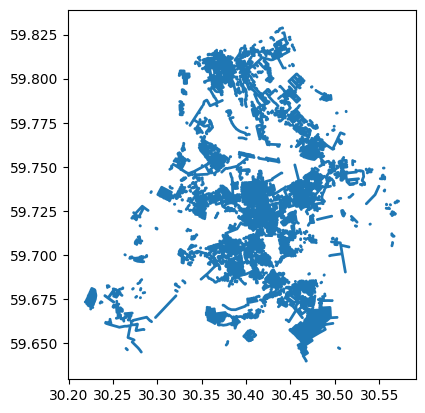

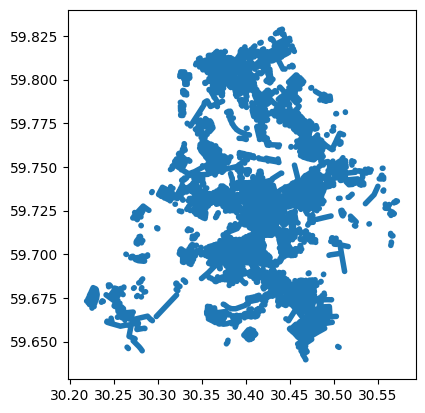

In [ ]:
roads_cat4.plot()
buffered_cat4_30.plot()
buffered_cat4_60.plot()
buffered_cat4_90.plot()

In [ ]:
def join_buildings(buffer_category, roads_category):
    buffered_category = {
        'cat1_30': buffered_cat1_30,
        'cat1_60': buffered_cat1_60,
        'cat1_90': buffered_cat1_90,
        'cat2_30': buffered_cat2_30,
        'cat2_60': buffered_cat2_60,
        'cat2_90': buffered_cat2_90,
        'cat3_30': buffered_cat3_30,
        'cat3_60': buffered_cat3_60,
        'cat3_90': buffered_cat3_90,
        'cat4_30': buffered_cat4_30,
        'cat4_60': buffered_cat4_60,
        'cat4_90': buffered_cat4_90,

    }.get(buffer_category)

    joined = buildings_gdf.sjoin(buffered_category, how='left')
    #joined = buildings_gdf.sjoin(buffered_category, how="left", predicate='intersects')
    joined.rename(columns={'index_right': 'index_roads'}, inplace=True)
    #joined.drop_duplicates(subset='id_left',inplace=True)
    if roads_category:
        joined['buffered_highway'] = \
            joined['buffered_highway'].apply(lambda x: 'not_residential' if pd.isnull(x) else x)
    else:
        joined['buffered_highway'] = \
            joined['buffered_highway'].apply(lambda x: 'residential' if pd.isnull(x) else x)

    joined.reset_index(inplace=True, drop=True)

    return joined

In [ ]:
buffer_categories = ['cat1_30', 'cat1_60', 'cat1_90','cat2_30','cat2_60','cat2_90',\
                    'cat3_30', 'cat3_60', 'cat3_90','cat4_30','cat4_60','cat4_90']
roads_category = 1                      # 1 is residential, 0 is ['primary', 'secondary','tertiary']
joined_buildings1 = join_buildings(buffer_categories[0],roads_category)
joined_buildings2 = join_buildings(buffer_categories[1],roads_category)
joined_buildings3 = join_buildings(buffer_categories[2],roads_category)
roads_category = 0
joined_buildings4 = join_buildings(buffer_categories[3],roads_category)
joined_buildings5 = join_buildings(buffer_categories[4],roads_category)
joined_buildings6 = join_buildings(buffer_categories[5],roads_category)
joined_buildings7 = join_buildings(buffer_categories[6],roads_category)
joined_buildings8 = join_buildings(buffer_categories[7],roads_category)
joined_buildings9 = join_buildings(buffer_categories[8],roads_category)
joined_buildings10 = join_buildings(buffer_categories[9],roads_category)
joined_buildings11 = join_buildings(buffer_categories[10],roads_category)
joined_buildings12 = join_buildings(buffer_categories[11],roads_category)

In [ ]:
print(joined_buildings1.shape)
print(joined_buildings2.shape)
print(joined_buildings3.shape)
print(joined_buildings4.shape)
print(joined_buildings5.shape)
print(joined_buildings6.shape)
print(joined_buildings7.shape)
print(joined_buildings8.shape)
print(joined_buildings9.shape)
print(joined_buildings10.shape)
print(joined_buildings11.shape)
print(joined_buildings12.shape)

(21280, 16)
(21280, 16)
(21280, 16)
(21280, 16)
(21280, 16)
(21280, 16)
(21280, 16)
(21280, 16)
(21280, 16)
(21280, 16)
(21280, 16)
(21280, 16)


In [ ]:
joined_buildings1.groupby('official_type').count()

,id_left,building,geometry,all_tag_keys,all_tags,index_landuse,landuse,land_building,index_official,name,addr_stree,addr_house,index_roads,id_right,buffered_highway
official_type,,,,,,,,,,,,,,,
NON_RES,21196,21196,21196,21196,21196,18881,21196,21196,21196,452,8513,7473,7928,7928,21196
RES,84,84,84,84,84,79,84,84,84,2,74,76,37,37,84


In [ ]:
joined_buildings1.groupby(['official_type','buffered_highway']).count()

id_left  building  geometry  all_tag_keys  \
official_type buffered_highway                                              
NON_RES       not_residential     13268     13268     13268         13268   
              residential          7928      7928      7928          7928   
RES           not_residential        47        47        47            47   
              residential            37        37        37            37   

                                all_tags  index_landuse  landuse  \
official_type buffered_highway                                     
NON_RES       not_residential      13268          11431    13268   
              residential           7928           7450     7928   
RES           not_residential         47             46       47   
              residential             37             33       37   

                                land_building  index_official  name  \
official_type buffered_highway                                        
NON_RES       not_residential           13268           13268   343   
              residential                7928            7928   109   
RES           not_residential              47              47     1   
              residential                  37              37     1   

                                addr_stree  addr_house  index_roads  id_right  
official_type buffered_highway                                                 
NON_RES       not_residential         4268        3377            0         0  
              residential             4245        4096         7928      7928  
RES           not_residential           41          42            0         0  
              residential               33          34           37        37

In [ ]:
joined_buildings1[(joined_buildings1['land_building'] == 'commercial')\
               &(joined_buildings1['buffered_highway'] == 'residential')].shape

(9, 16)

In [ ]:
joined_buildings2.groupby(['official_type','buffered_highway']).count()

id_left  building  geometry  all_tag_keys  \
official_type buffered_highway                                              
NON_RES       not_residential      8075      8075      8075          8075   
              residential         13121     13121     13121         13121   
RES           not_residential        19        19        19            19   
              residential            65        65        65            65   

                                all_tags  index_landuse  landuse  \
official_type buffered_highway                                     
NON_RES       not_residential       8075           6698     8075   
              residential          13121          12183    13121   
RES           not_residential         19             19       19   
              residential             65             60       65   

                                land_building  index_official  name  \
official_type buffered_highway                                        
NON_RES       not_residential            8075            8075   246   
              residential               13121           13121   206   
RES           not_residential              19              19     0   
              residential                  65              65     2   

                                addr_stree  addr_house  index_roads  id_right  
official_type buffered_highway                                                 
NON_RES       not_residential         2409        1831            0         0  
              residential             6104        5642        13121     13121  
RES           not_residential           15          16            0         0  
              residential               59          60           65        65

In [ ]:
joined_buildings3.groupby(['official_type','buffered_highway']).count()

id_left  building  geometry  all_tag_keys  \
official_type buffered_highway                                              
NON_RES       not_residential      5140      5140      5140          5140   
              residential         16056     16056     16056         16056   
RES           not_residential         6         6         6             6   
              residential            78        78        78            78   

                                all_tags  index_landuse  landuse  \
official_type buffered_highway                                     
NON_RES       not_residential       5140           4158     5140   
              residential          16056          14723    16056   
RES           not_residential          6              6        6   
              residential             78             73       78   

                                land_building  index_official  name  \
official_type buffered_highway                                        
NON_RES       not_residential            5140            5140   176   
              residential               16056           16056   276   
RES           not_residential               6               6     0   
              residential                  78              78     2   

                                addr_stree  addr_house  index_roads  id_right  
official_type buffered_highway                                                 
NON_RES       not_residential         1358        1030            0         0  
              residential             7155        6443        16056     16056  
RES           not_residential            3           4            0         0  
              residential               71          72           78        78

In [ ]:
joined_buildings4.groupby(['official_type','buffered_highway']).count()

id_left  building  geometry  all_tag_keys  \
official_type buffered_highway                                              
NON_RES       non_res_road         1330      1330      1330          1330   
              residential         19866     19866     19866         19866   
RES           non_res_road           23        23        23            23   
              residential            61        61        61            61   

                                all_tags  index_landuse  landuse  \
official_type buffered_highway                                     
NON_RES       non_res_road          1330           1046     1330   
              residential          19866          17835    19866   
RES           non_res_road            23             20       23   
              residential             61             59       61   

                                land_building  index_official  name  \
official_type buffered_highway                                        
NON_RES       non_res_road               1330            1330    94   
              residential               19866           19866   358   
RES           non_res_road                 23              23     2   
              residential                  61              61     0   

                                addr_stree  addr_house  index_roads  id_right  
official_type buffered_highway                                                 
NON_RES       non_res_road             830         827         1330      1330  
              residential             7683        6646            0         0  
RES           non_res_road              23          23           23        23  
              residential               51          53            0         0

In [ ]:
joined_buildings5.groupby(['official_type','buffered_highway']).count()

id_left  building  geometry  all_tag_keys  \
official_type buffered_highway                                              
NON_RES       non_res_road         4448      4448      4448          4448   
              residential         16748     16748     16748         16748   
RES           non_res_road           40        40        40            40   
              residential            44        44        44            44   

                                all_tags  index_landuse  landuse  \
official_type buffered_highway                                     
NON_RES       non_res_road          4448           3715     4448   
              residential          16748          15166    16748   
RES           non_res_road            40             36       40   
              residential             44             43       44   

                                land_building  index_official  name  \
official_type buffered_highway                                        
NON_RES       non_res_road               4448            4448   217   
              residential               16748           16748   235   
RES           non_res_road                 40              40     2   
              residential                  44              44     0   

                                addr_stree  addr_house  index_roads  id_right  
official_type buffered_highway                                                 
NON_RES       non_res_road            2184        2174         4448      4448  
              residential             6329        5299            0         0  
RES           non_res_road              40          40           40        40  
              residential               34          36            0         0

In [ ]:
joined_buildings6.groupby(['official_type','buffered_highway']).count()

id_left  building  geometry  all_tag_keys  \
official_type buffered_highway                                              
NON_RES       non_res_road         7455      7455      7455          7455   
              residential         13741     13741     13741         13741   
RES           non_res_road           58        58        58            58   
              residential            26        26        26            26   

                                all_tags  index_landuse  landuse  \
official_type buffered_highway                                     
NON_RES       non_res_road          7455           6393     7455   
              residential          13741          12488    13741   
RES           non_res_road            58             53       58   
              residential             26             26       26   

                                land_building  index_official  name  \
official_type buffered_highway                                        
NON_RES       non_res_road               7455            7455   296   
              residential               13741           13741   156   
RES           non_res_road                 58              58     2   
              residential                  26              26     0   

                                addr_stree  addr_house  index_roads  id_right  
official_type buffered_highway                                                 
NON_RES       non_res_road            3479        3444         7455      7455  
              residential             5034        4029            0         0  
RES           non_res_road              58          58           58        58  
              residential               16          18            0         0

In [ ]:
joined_buildings7.groupby(['official_type','buffered_highway']).count()

id_left  building  geometry  all_tag_keys  \
official_type buffered_highway                                              
NON_RES       residential         21155     21155     21155         21155   
              roads_cat3             41        41        41            41   
RES           residential            84        84        84            84   

                                all_tags  index_landuse  landuse  \
official_type buffered_highway                                     
NON_RES       residential          21155          18871    21155   
              roads_cat3              41             10       41   
RES           residential             84             79       84   

                                land_building  index_official  name  \
official_type buffered_highway                                        
NON_RES       residential               21155           21155   447   
              roads_cat3                   41              41     5   
RES           residential                  84              84     2   

                                addr_stree  addr_house  index_roads  id_right  
official_type buffered_highway                                                 
NON_RES       residential             8510        7470            0         0  
              roads_cat3                 3           3           41        41  
RES           residential               74          76            0         0

In [ ]:
joined_buildings8.groupby(['official_type','buffered_highway']).count()

id_left  building  geometry  all_tag_keys  \
official_type buffered_highway                                              
NON_RES       residential         20948     20948     20948         20948   
              roads_cat3            248       248       248           248   
RES           residential            83        83        83            83   
              roads_cat3              1         1         1             1   

                                all_tags  index_landuse  landuse  \
official_type buffered_highway                                     
NON_RES       residential          20948          18710    20948   
              roads_cat3             248            171      248   
RES           residential             83             78       83   
              roads_cat3               1              1        1   

                                land_building  index_official  name  \
official_type buffered_highway                                        
NON_RES       residential               20948           20948   423   
              roads_cat3                  248             248    29   
RES           residential                  83              83     2   
              roads_cat3                    1               1     0   

                                addr_stree  addr_house  index_roads  id_right  
official_type buffered_highway                                                 
NON_RES       residential             8453        7405            0         0  
              roads_cat3                60          68          248       248  
RES           residential               73          75            0         0  
              roads_cat3                 1           1            1         1

In [ ]:
joined_buildings9.groupby(['official_type','buffered_highway']).count()

id_left  building  geometry  all_tag_keys  \
official_type buffered_highway                                              
NON_RES       residential         20729     20729     20729         20729   
              roads_cat3            467       467       467           467   
RES           residential            82        82        82            82   
              roads_cat3              2         2         2             2   

                                all_tags  index_landuse  landuse  \
official_type buffered_highway                                     
NON_RES       residential          20729          18511    20729   
              roads_cat3             467            370      467   
RES           residential             82             77       82   
              roads_cat3               2              2        2   

                                land_building  index_official  name  \
official_type buffered_highway                                        
NON_RES       residential               20729           20729   411   
              roads_cat3                  467             467    41   
RES           residential                  82              82     2   
              roads_cat3                    2               2     0   

                                addr_stree  addr_house  index_roads  id_right  
official_type buffered_highway                                                 
NON_RES       residential             8386        7324            0         0  
              roads_cat3               127         149          467       467  
RES           residential               73          75            0         0  
              roads_cat3                 1           1            2         2

In [ ]:
len(areahandler.osm_data)

21281

In [ ]:
keys_list = []
for sublist in areahandler.osm_data:
    keys_list.append(sublist[3])

In [ ]:
keys_list_flat = [val for sublist in keys_list for val in sublist]

In [ ]:
unique_keys = sorted(list(set(keys_list_flat)))

In [ ]:
unique_keys

['abandoned',
 'abandoned:building',
 'access',
 'addr2:housenumber',
 'addr2:street',
 'addr:city',
 'addr:country',
 'addr:district',
 'addr:full',
 'addr:hamlet',
 'addr:housename',
 'addr:housenumber',
 'addr:letter',
 'addr:place',
 'addr:postcode',
 'addr:region',
 'addr:street',
 'addr:street2',
 'addr:suburb',
 'addr:suburb:rgis',
 'addr:unit',
 'aeroway',
 'air_conditioning',
 'alt_name',
 'alt_name:1',
 'alt_name:2',
 'alt_name:3',
 'alt_name:4',
 'alt_name:de',
 'alt_name:en',
 'alt_name:fr',
 'alt_name:ja',
 'alt_name:ru',
 'alt_name:uk',
 'alt_name:zh',
 'amenity',
 'architect',
 'architect:en',
 'architect:it',
 'area',
 'artist_name',
 'atm',
 'automated',
 'barrier',
 'barrier:personnel',
 'bath:tub',
 'bath:type',
 'beds',
 'bench',
 'bin',
 'branch',
 'brand',
 'brand:en',
 'brand:ru',
 'brand:wikidata',
 'brand:wikipedia',
 'breakfast',
 'building',
 'building:architecture',
 'building:cladding',
 'building:colour',
 'building:developer',
 'building:facade:material',

In [ ]:
key_freq = []
for key in unique_keys:
    key_freq.append(keys_list_flat.count(key))

In [ ]:
len(key_freq)

307

In [ ]:
keys_tuples = list(zip(unique_keys, key_freq))
keys_freq_df = pd.DataFrame(keys_tuples, columns = ['Key', 'Freq'])

In [ ]:
keys_freq_df.sort_values(by=['Freq'], inplace=True, ascending=False)

In [ ]:
keys_freq_df.reset_index(inplace=True, drop=True)

In [ ]:
keys_freq_df.head()

,Key,Freq
0,building,21281
1,addr:street,8600
2,addr:housenumber,7560
3,addr:city,6463
4,building:levels,5841


In [ ]:
keys_freq_df.sort_values(by=['Key'], inplace=False, ascending=True).head(20)

,Key,Freq
40,abandoned,100
306,abandoned:building,1
14,access,453
168,addr2:housenumber,3
110,addr2:street,13
3,addr:city,6463
21,addr:country,256
156,addr:district,5
239,addr:full,1
240,addr:hamlet,1


In [ ]:
keys_freq_df.head(21)

,Key,Freq
0,building,21281
1,addr:street,8600
2,addr:housenumber,7560
3,addr:city,6463
4,building:levels,5841
5,roof:shape,2646
6,addr:suburb,1486
7,roof:levels,937
8,addr:postcode,830
9,height,714


In [ ]:
selected_tags = ['source','addr:street','name','building:levels',\
                'roof:shape','amenity','brand','website','shop']
num_keys = len(selected_tags)+2

In [ ]:
len(selected_tags)

9

In [ ]:
def preprocess_data(input_data, value_tags, selected_tags):
    col_pos = 2
    for tag_key in selected_tags:
        col_name = tag_key
        input_data.insert(col_pos,col_name,0)
        input_data[col_name] = input_data.apply(lambda x: 1 if tag_key in list(x['all_tag_keys']) \
            else 0, axis=1)

    for tag_key in value_tags:
        input_data[tag_key] = input_data.apply(lambda x: x['all_tags'].get(tag_key) \
            if tag_key in list(x['all_tag_keys']) else 0, axis=1)

    # fix anomalies in FFX County data
    input_data.drop(input_data[(input_data['building:levels'] == 'K-6')].index, inplace=True)
    input_data.loc[(input_data['building:levels'] == '-1,1,2,3'),'building:levels']=4

    input_data.drop(columns=['all_tag_keys', 'all_tags'], inplace=True)

    input_data['official_type'] = \
    input_data['official_type'].apply(lambda x: 1 if x == 'RES' else 0)

    return input_data

In [ ]:
def add_buffers(input_data,col_names, buffers_list):
    for num in range(0, len(col_names)):
        input_data.insert(num+2,col_names[num],buffers_list[num])
        input_data[col_names[num]] = input_data[col_names[num]].apply(lambda x: 1 if x == 'residential' else 0)

    return input_data

In [ ]:
#num_buffers = 6
#buffer_loc = 0
#value_tags = ['roof:shape','building:levels']
#col_names = ['buffer_cat1_30','buffer_cat1_60','buffer_cat1_90',\
#            'buffer_cat2_30','buffer_cat2_60','buffer_cat2_90']
#buffers_list = [joined_buildings1['buffered_highway'],joined_buildings2['buffered_highway'],\
#                joined_buildings3['buffered_highway'],joined_buildings4['buffered_highway'],\
#                joined_buildings5['buffered_highway'],joined_buildings6['buffered_highway']]

num_buffers = 12
buffer_loc = 0
value_tags = ['roof:shape','building:levels']
col_names = ['buffer_cat1_30','buffer_cat1_60','buffer_cat1_90',\
            'buffer_cat2_30','buffer_cat2_60','buffer_cat2_90',\
            'buffer_cat3_30','buffer_cat3_60','buffer_cat3_90',\
            'buffer_cat4_30','buffer_cat4_60','buffer_cat4_90']
buffers_list = [joined_buildings1['buffered_highway'],joined_buildings2['buffered_highway'],\
                joined_buildings3['buffered_highway'],joined_buildings4['buffered_highway'],\
                joined_buildings5['buffered_highway'],joined_buildings6['buffered_highway'],\
                joined_buildings7['buffered_highway'],joined_buildings8['buffered_highway'],\
                joined_buildings9['buffered_highway'],joined_buildings10['buffered_highway'],\
                joined_buildings11['buffered_highway'],joined_buildings12['buffered_highway']]
backup_data = joined_buildings1.copy()
#input_data = input_data[['geometry','official_type','land_building','all_tag_keys','all_tags']]
#input_data = input_data[['geometry','official_type','building','landuse','all_tag_keys','all_tags']]
#input_data = input_data[['geometry','official_type','building','landuse',\
#                        'all_tag_keys','all_tags','id_left']]
#input_data = input_data[['geometry','official_type','building','landuse','amenity_key','parking_area',\
#                        'all_tag_keys','all_tags']]
backup_data = backup_data[['geometry','official_type','building','landuse','land_building',\
                        'all_tag_keys','all_tags','id_left']]
backup_data.insert(len(backup_data.columns), 'area',backup_data['geometry'].to_crs(epsg=32610).area)
backup_data = preprocess_data(backup_data,value_tags,selected_tags)

backup_data = add_buffers(backup_data,col_names[buffer_loc:buffer_loc+num_buffers],\
                         buffers_list[buffer_loc:buffer_loc+num_buffers])

In [ ]:
len(areahandler.amenity_data)

1109

In [ ]:
# transform the list of roads into a pandas DataFrame
amenity_colnames = ['amenity_key', 'geometry']
amenity_df = pd.DataFrame(areahandler.amenity_data, columns=amenity_colnames)

In [ ]:
amenity_df.head()

,amenity_key,geometry
0,fuel,"POLYGON ((30.4514239 59.7315336, 30.4514462 59..."
1,hospital,"POLYGON ((30.4184702 59.7184525, 30.4186923 59..."
2,parking,"POLYGON ((30.3976537 59.7994382, 30.3978163 59..."
3,place_of_worship,"POLYGON ((30.3809301 59.7074697, 30.3811237 59..."
4,fuel,"POLYGON ((30.4934777 59.7478744, 30.4937039 59..."


In [ ]:
amenity_df.shape

(1109, 2)

In [ ]:
amenity_categories = amenity_df.groupby(['amenity_key'])['geometry'].count().reset_index(name="count")

In [ ]:
amenity_categories.tail(50)

,amenity_key,count
0,arts_centre,4
1,bench,1
2,bicycle_parking,1
3,bicycle_rental,2
4,boat_rental,2
5,cafe,21
6,car_wash,19
7,checkpoint,3
8,clinic,1
9,college,3


In [ ]:
parking_df = amenity_df[(amenity_df['amenity_key'] == 'parking') | (amenity_df['amenity_key'] == 'parking_space')]

In [ ]:
parking_df = parking_df.assign(amenity_key='parking')

In [ ]:
parking_df.reset_index(inplace=True, drop=True)

In [ ]:
parking_df.shape

(696, 2)

In [ ]:
parking_gdf = geopandas.GeoDataFrame(parking_df.copy(),crs="EPSG:4326",geometry='geometry')

In [ ]:
parking_gdf.insert(len(parking_gdf.columns), 'parking_area',parking_gdf['geometry'].to_crs(epsg=32610).area)

In [ ]:
parking_gdf.head()

,amenity_key,geometry,parking_area
0,parking,"POLYGON ((30.39765 59.79944, 30.39782 59.79935...",17329.974670
1,parking,"POLYGON ((30.37816 59.70889, 30.37831 59.70872...",1022.083335
2,parking,"POLYGON ((30.35611 59.72783, 30.35621 59.72771...",327.485507
3,parking,"POLYGON ((30.40197 59.72712, 30.40247 59.72696...",927.581119
4,parking,"POLYGON ((30.41785 59.74233, 30.41789 59.74225...",4411.553131


In [ ]:
parking_gdf.shape

(696, 3)

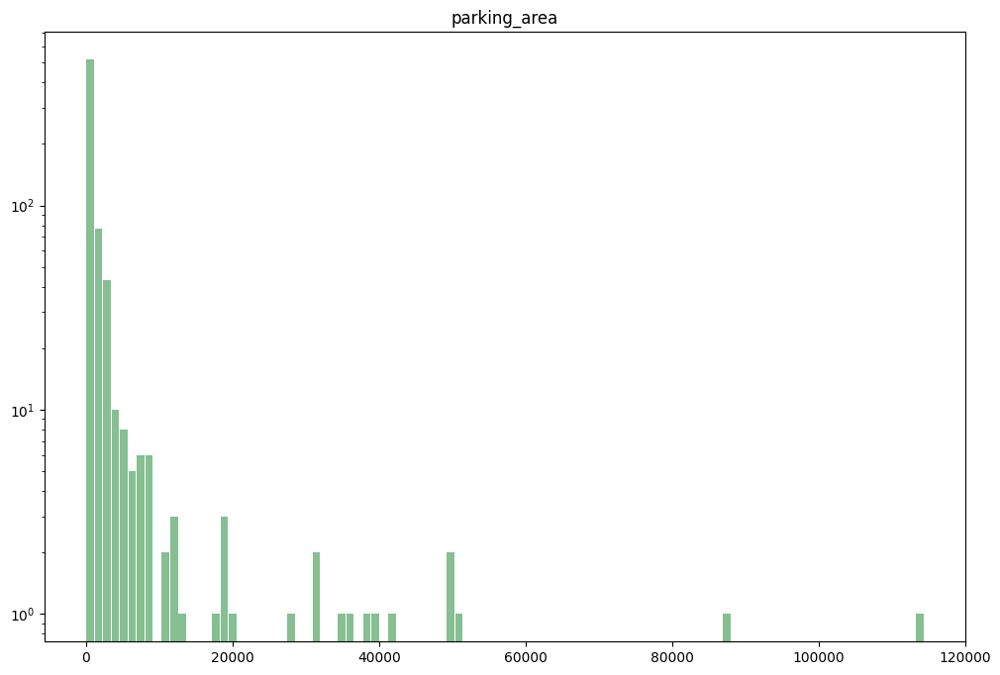

In [ ]:
hist = parking_gdf.hist(bins=100, grid=False, figsize=(12,8), color='#86bf91', zorder=2, rwidth=0.9)
plt.yscale('log')

In [ ]:
breaks = jenkspy.jenks_breaks(parking_gdf['parking_area'],3) # ,nb_class=3
print(breaks)

[np.float64(10.917897683172662), np.float64(13174.436201620123), np.float64(51153.72474254846), np.float64(114400.06445435096)]


In [ ]:
bins_list = ['bin1','bin2','bin3']
parking_gdf['cut_jenks'] = pd.cut(parking_gdf['parking_area'],
                                bins=breaks,
                                labels=bins_list,
                                include_lowest=True)

In [ ]:
parking_gdf.head()

,amenity_key,geometry,parking_area,cut_jenks
0,parking,"POLYGON ((30.39765 59.79944, 30.39782 59.79935...",17329.974670,bin2
1,parking,"POLYGON ((30.37816 59.70889, 30.37831 59.70872...",1022.083335,bin1
2,parking,"POLYGON ((30.35611 59.72783, 30.35621 59.72771...",327.485507,bin1
3,parking,"POLYGON ((30.40197 59.72712, 30.40247 59.72696...",927.581119,bin1
4,parking,"POLYGON ((30.41785 59.74233, 30.41789 59.74225...",4411.553131,bin1


In [ ]:
for bin in bins_list:
    parking_gdf[bin] = 0
   # parking_gdf.insert(len(parking_gdf.columns),bin,0)
    parking_gdf[bin] = parking_gdf.apply(lambda x: 1 if x['cut_jenks'] == bin
                                     else 0, axis=1)

In [ ]:
parking_gdf.head()

,amenity_key,geometry,parking_area,cut_jenks,bin1,bin2,bin3
0,parking,"POLYGON ((30.39765 59.79944, 30.39782 59.79935...",17329.974670,bin2,0,1,0
1,parking,"POLYGON ((30.37816 59.70889, 30.37831 59.70872...",1022.083335,bin1,1,0,0
2,parking,"POLYGON ((30.35611 59.72783, 30.35621 59.72771...",327.485507,bin1,1,0,0
3,parking,"POLYGON ((30.40197 59.72712, 30.40247 59.72696...",927.581119,bin1,1,0,0
4,parking,"POLYGON ((30.41785 59.74233, 30.41789 59.74225...",4411.553131,bin1,1,0,0


In [ ]:
backup_data.columns

Index(['geometry', 'official_type', 'buffer_cat1_30', 'buffer_cat1_60',
       'buffer_cat1_90', 'buffer_cat2_30', 'buffer_cat2_60', 'buffer_cat2_90',
       'buffer_cat3_30', 'buffer_cat3_60', 'buffer_cat3_90', 'buffer_cat4_30',
       'buffer_cat4_60', 'buffer_cat4_90', 'shop', 'website', 'brand',
       'amenity', 'roof:shape', 'building:levels', 'name', 'addr:street',
       'source', 'building', 'landuse', 'land_building', 'id_left', 'area'],
      dtype='object')

In [ ]:
radius_list = [30,60,90]
counter = 1
for bin in bins_list:
    for radius in radius_list:
        parking_buffer = parking_gdf.copy()
        parking_buffer = parking_buffer[['geometry',bin]]
        col_name = 'parking_cat'+str(counter)
        counter += 1
        parking_buffer.rename(columns={bin: col_name}, inplace=True)
        parking_buffer['geometry'] = parking_buffer['geometry'].to_crs(epsg=32636).buffer(radius)
        parking_buffer.to_crs(epsg=4326, inplace=True)
        buildings_parking = backup_data.sjoin(parking_buffer, how="left", predicate='intersects')
        buildings_parking[col_name] = buildings_parking[col_name].fillna(0)
        buildings_parking.drop_duplicates(subset='id_left',inplace=True)
        buildings_parking.reset_index(inplace=True, drop=True)
        backup_data.insert(len(backup_data.columns),col_name,list(buildings_parking[col_name]))

In [ ]:
backup_data.drop(columns=['id_left'], inplace=True)

In [ ]:
backup_data.shape

(21280, 36)

In [ ]:
backup_data.head()

,geometry,official_type,buffer_cat1_30,buffer_cat1_60,buffer_cat1_90,buffer_cat2_30,buffer_cat2_60,buffer_cat2_90,buffer_cat3_30,buffer_cat3_60,...,area,parking_cat1,parking_cat2,parking_cat3,parking_cat4,parking_cat5,parking_cat6,parking_cat7,parking_cat8,parking_cat9
0,"POLYGON ((30.46898 59.75973, 30.46915 59.75966...",0,0,0,1,1,1,1,1,1,...,960.310132,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,"POLYGON ((30.47006 59.76038, 30.47132 59.75985...",0,0,1,1,1,1,1,1,1,...,1203.790947,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,"POLYGON ((30.46917 59.75636, 30.47013 59.75595...",0,0,0,1,1,1,1,1,1,...,911.332595,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
3,"POLYGON ((30.41314 59.73801, 30.4132 59.73789,...",0,0,0,0,0,0,0,1,1,...,1305.350409,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,"POLYGON ((30.38568 59.71801, 30.38583 59.71796...",0,0,0,0,1,1,1,1,1,...,2331.360427,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
backup_data.loc[(backup_data['building:levels'] == '1;3;2'),'building:levels']=3
backup_data.loc[(backup_data['building:levels'] == '4 floors'),'building:levels']=4

In [ ]:
input_data = backup_data.copy()

In [ ]:
input_data.columns

Index(['geometry', 'official_type', 'buffer_cat1_30', 'buffer_cat1_60',
       'buffer_cat1_90', 'buffer_cat2_30', 'buffer_cat2_60', 'buffer_cat2_90',
       'buffer_cat3_30', 'buffer_cat3_60', 'buffer_cat3_90', 'buffer_cat4_30',
       'buffer_cat4_60', 'buffer_cat4_90', 'shop', 'website', 'brand',
       'amenity', 'roof:shape', 'building:levels', 'name', 'addr:street',
       'source', 'building', 'landuse', 'land_building', 'area',
       'parking_cat1', 'parking_cat2', 'parking_cat3', 'parking_cat4',
       'parking_cat5', 'parking_cat6', 'parking_cat7', 'parking_cat8',
       'parking_cat9'],
      dtype='object')

In [ ]:
input_data.drop(columns=['land_building', 'roof:shape'], inplace=True)

In [ ]:
input_data.columns

Index(['geometry', 'official_type', 'buffer_cat1_30', 'buffer_cat1_60',
       'buffer_cat1_90', 'buffer_cat2_30', 'buffer_cat2_60', 'buffer_cat2_90',
       'buffer_cat3_30', 'buffer_cat3_60', 'buffer_cat3_90', 'buffer_cat4_30',
       'buffer_cat4_60', 'buffer_cat4_90', 'shop', 'website', 'brand',
       'amenity', 'building:levels', 'name', 'addr:street', 'source',
       'building', 'landuse', 'area', 'parking_cat1', 'parking_cat2',
       'parking_cat3', 'parking_cat4', 'parking_cat5', 'parking_cat6',
       'parking_cat7', 'parking_cat8', 'parking_cat9'],
      dtype='object')

In [ ]:
input_data.groupby('landuse').count().sort_values(by=['geometry'], inplace=False, ascending=False).head(50)

,geometry,official_type,buffer_cat1_30,buffer_cat1_60,buffer_cat1_90,buffer_cat2_30,buffer_cat2_60,buffer_cat2_90,buffer_cat3_30,buffer_cat3_60,...,area,parking_cat1,parking_cat2,parking_cat3,parking_cat4,parking_cat5,parking_cat6,parking_cat7,parking_cat8,parking_cat9
landuse,,,,,,,,,,,,,,,,,,,,,
residential,10687,10687,10687,10687,10687,10687,10687,10687,10687,10687,...,10687,10687,10687,10687,10687,10687,10687,10687,10687,10687
allotments,5486,5486,5486,5486,5486,5486,5486,5486,5486,5486,...,5486,5486,5486,5486,5486,5486,5486,5486,5486,5486
no_landuse,2320,2320,2320,2320,2320,2320,2320,2320,2320,2320,...,2320,2320,2320,2320,2320,2320,2320,2320,2320,2320
non_res,1836,1836,1836,1836,1836,1836,1836,1836,1836,1836,...,1836,1836,1836,1836,1836,1836,1836,1836,1836,1836
military,418,418,418,418,418,418,418,418,418,418,...,418,418,418,418,418,418,418,418,418,418
garages,249,249,249,249,249,249,249,249,249,249,...,249,249,249,249,249,249,249,249,249,249
construction,137,137,137,137,137,137,137,137,137,137,...,137,137,137,137,137,137,137,137,137,137
farmyard,26,26,26,26,26,26,26,26,26,26,...,26,26,26,26,26,26,26,26,26,26
farmland,25,25,25,25,25,25,25,25,25,25,...,25,25,25,25,25,25,25,25,25,25


In [ ]:
input_data['landuse'].unique()

array(['residential', 'construction', 'no_landuse', 'non_res',
       'religious', 'garages', 'military', 'cemetery', 'depot',
       'brownfield', 'allotments', 'orchard', 'meadow', 'farmyard',
       'farmland', 'natural_reserve', 'forest', 'vineyard'], dtype=object)

In [ ]:
input_data.shape

(21280, 34)

In [ ]:
input_data.groupby('building').count().sort_values(by=['geometry'], inplace=False, ascending=False).head(20)

,geometry,official_type,buffer_cat1_30,buffer_cat1_60,buffer_cat1_90,buffer_cat2_30,buffer_cat2_60,buffer_cat2_90,buffer_cat3_30,buffer_cat3_60,...,area,parking_cat1,parking_cat2,parking_cat3,parking_cat4,parking_cat5,parking_cat6,parking_cat7,parking_cat8,parking_cat9
building,,,,,,,,,,,,,,,,,,,,,
yes,13575,13575,13575,13575,13575,13575,13575,13575,13575,13575,...,13575,13575,13575,13575,13575,13575,13575,13575,13575,13575
house,2633,2633,2633,2633,2633,2633,2633,2633,2633,2633,...,2633,2633,2633,2633,2633,2633,2633,2633,2633,2633
apartments,1297,1297,1297,1297,1297,1297,1297,1297,1297,1297,...,1297,1297,1297,1297,1297,1297,1297,1297,1297,1297
detached,765,765,765,765,765,765,765,765,765,765,...,765,765,765,765,765,765,765,765,765,765
greenhouse,536,536,536,536,536,536,536,536,536,536,...,536,536,536,536,536,536,536,536,536,536
service,374,374,374,374,374,374,374,374,374,374,...,374,374,374,374,374,374,374,374,374,374
semidetached_house,302,302,302,302,302,302,302,302,302,302,...,302,302,302,302,302,302,302,302,302,302
garage,210,210,210,210,210,210,210,210,210,210,...,210,210,210,210,210,210,210,210,210,210
garages,204,204,204,204,204,204,204,204,204,204,...,204,204,204,204,204,204,204,204,204,204


In [ ]:
#input_data.to_pickle("./Vasily_Input_Data/Vasily.pkl")

In [ ]:
#type(input_data['building'].unique())

In [ ]:
#test_array = np.array(['a','b','c','dormitory', 'office', 'yes', 'university'], dtype=object)

In [ ]:
#test_array

In [ ]:
#a = np.array([1, 2, 3, 2, 4, 1,9])
#b = np.array([3, 4, 5, 6,7,8])
#np.setxor1d(a, b)

In [ ]:
input_data['building'].unique()

array(['apartments', 'yes', 'dormitory', 'retail', 'residential',
       'office', 'kindergarten', 'school', 'commercial', 'industrial',
       'tower', 'palace', 'service', 'university', 'house', 'hospital',
       'policlinic', 'hotel', 'church', 'government', 'mansion',
       'toilets', 'chapel', 'public', 'greenhouse', 'store',
       'construction', 'garages', 'bunker', 'ruins', 'kiosk', 'college',
       'detached', 'garage', 'community_centre', 'roof', 'hangar',
       'train_station', 'manufacture', 'warehouse', 'stable',
       'semidetached_house', 'shed', 'bell_tower', 'civic', 'fuel',
       'terrace', 'water_tower', 'collapsed', 'castle', 'guardhouse',
       'no', 'temple', 'pavilion', 'farm_auxiliary', 'parking', 'bridge',
       'cathedral', 'bath', 'carport', 'storage_tank', 'container',
       'triumphal_arch', 'fire_station', 'clinic', 'gate', 'marquee',
       'allotment_house', 'gazebo', 'tent', 'sports_centre', 'grandstand',
       'static_caravan', 'museum'], dt

In [ ]:
common_features = np.array(['apartments', 'church', 'civic', 'commercial', 'construction',
       'detached', 'dormitory', 'garage', 'garages', 'greenhouse',
       'hospital', 'hotel', 'house', 'industrial', 'kindergarten',
       'office', 'parking', 'public', 'residential', 'retail', 'roof',
       'school', 'semidetached_house', 'service', 'shed',
       'static_caravan', 'terrace', 'warehouse', 'yes'], dtype=object)

In [ ]:
unique_buildings = np.setxor1d(input_data['building'].unique(), common_features).tolist()

In [ ]:
unique_buildings

['allotment_house',
 'bath',
 'bell_tower',
 'bridge',
 'bunker',
 'carport',
 'castle',
 'cathedral',
 'chapel',
 'clinic',
 'collapsed',
 'college',
 'community_centre',
 'container',
 'farm_auxiliary',
 'fire_station',
 'fuel',
 'gate',
 'gazebo',
 'government',
 'grandstand',
 'guardhouse',
 'hangar',
 'kiosk',
 'mansion',
 'manufacture',
 'marquee',
 'museum',
 'no',
 'palace',
 'pavilion',
 'policlinic',
 'ruins',
 'sports_centre',
 'stable',
 'storage_tank',
 'store',
 'temple',
 'tent',
 'toilets',
 'tower',
 'train_station',
 'triumphal_arch',
 'university',
 'water_tower']

In [ ]:
len(unique_buildings)

45

In [ ]:
input_data[input_data['building'].isin(unique_buildings)].shape

(385, 34)

In [ ]:
input_data['building'] = input_data['building'].apply(\
                                lambda x: 'misc_buildings' if x in(unique_buildings)
                                                else x)

In [ ]:
input_data[input_data['building'].isin(unique_buildings)].shape

(0, 34)

In [ ]:
input_data.shape

(21280, 34)

In [ ]:
input_data.groupby('building').count().sort_values(by=['geometry'], inplace=False, ascending=False).head(50)

,geometry,official_type,buffer_cat1_30,buffer_cat1_60,buffer_cat1_90,buffer_cat2_30,buffer_cat2_60,buffer_cat2_90,buffer_cat3_30,buffer_cat3_60,...,area,parking_cat1,parking_cat2,parking_cat3,parking_cat4,parking_cat5,parking_cat6,parking_cat7,parking_cat8,parking_cat9
building,,,,,,,,,,,,,,,,,,,,,
yes,13575,13575,13575,13575,13575,13575,13575,13575,13575,13575,...,13575,13575,13575,13575,13575,13575,13575,13575,13575,13575
house,2633,2633,2633,2633,2633,2633,2633,2633,2633,2633,...,2633,2633,2633,2633,2633,2633,2633,2633,2633,2633
apartments,1297,1297,1297,1297,1297,1297,1297,1297,1297,1297,...,1297,1297,1297,1297,1297,1297,1297,1297,1297,1297
detached,765,765,765,765,765,765,765,765,765,765,...,765,765,765,765,765,765,765,765,765,765
greenhouse,536,536,536,536,536,536,536,536,536,536,...,536,536,536,536,536,536,536,536,536,536
misc_buildings,385,385,385,385,385,385,385,385,385,385,...,385,385,385,385,385,385,385,385,385,385
service,374,374,374,374,374,374,374,374,374,374,...,374,374,374,374,374,374,374,374,374,374
semidetached_house,302,302,302,302,302,302,302,302,302,302,...,302,302,302,302,302,302,302,302,302,302
garage,210,210,210,210,210,210,210,210,210,210,...,210,210,210,210,210,210,210,210,210,210


In [ ]:
common_landuse = np.array(['non_res', 'no_landuse', 'residential', 'construction',
       'forest', 'recreation_ground', 'cemetery', 'farmyard'], dtype=object)

In [ ]:
unique_landuse = np.setxor1d(input_data['landuse'].unique(), common_landuse).tolist()

In [ ]:
unique_landuse

['allotments',
 'brownfield',
 'depot',
 'farmland',
 'garages',
 'meadow',
 'military',
 'natural_reserve',
 'orchard',
 'recreation_ground',
 'religious',
 'vineyard']

In [ ]:
input_data[input_data['landuse'].isin(unique_landuse)].shape

(6246, 34)

In [ ]:
input_data['landuse'] = input_data['landuse'].apply(\
                                lambda x: 'misc_landuse' if x in(unique_landuse)
                                                else x)

In [ ]:
input_data[input_data['landuse'].isin(unique_landuse)].shape

(0, 34)

In [ ]:
input_data.groupby('landuse').count().sort_values(by=['geometry'], inplace=False, ascending=False).head(50)

,geometry,official_type,buffer_cat1_30,buffer_cat1_60,buffer_cat1_90,buffer_cat2_30,buffer_cat2_60,buffer_cat2_90,buffer_cat3_30,buffer_cat3_60,...,area,parking_cat1,parking_cat2,parking_cat3,parking_cat4,parking_cat5,parking_cat6,parking_cat7,parking_cat8,parking_cat9
landuse,,,,,,,,,,,,,,,,,,,,,
residential,10687,10687,10687,10687,10687,10687,10687,10687,10687,10687,...,10687,10687,10687,10687,10687,10687,10687,10687,10687,10687
misc_landuse,6246,6246,6246,6246,6246,6246,6246,6246,6246,6246,...,6246,6246,6246,6246,6246,6246,6246,6246,6246,6246
no_landuse,2320,2320,2320,2320,2320,2320,2320,2320,2320,2320,...,2320,2320,2320,2320,2320,2320,2320,2320,2320,2320
non_res,1836,1836,1836,1836,1836,1836,1836,1836,1836,1836,...,1836,1836,1836,1836,1836,1836,1836,1836,1836,1836
construction,137,137,137,137,137,137,137,137,137,137,...,137,137,137,137,137,137,137,137,137,137
farmyard,26,26,26,26,26,26,26,26,26,26,...,26,26,26,26,26,26,26,26,26,26
cemetery,25,25,25,25,25,25,25,25,25,25,...,25,25,25,25,25,25,25,25,25,25
forest,3,3,3,3,3,3,3,3,3,3,...,3,3,3,3,3,3,3,3,3,3


In [ ]:
input_data['landuse'].replace(['residential','non_res','forest','cemetery','recreation_ground',\
                                'construction','farmyard'],['residential_landuse','non_res_landuse',\
                                'forest_landuse','cemetery_landuse','recreation_ground_landuse',\
                                'construction_landuse','farmyard_landuse'], inplace=True)

/tmp/ipython-input-227-2676512996.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  input_data['landuse'].replace(['residential','non_res','forest','cemetery','recreation_ground',\


In [ ]:
input_data.groupby('landuse').count().sort_values(by=['geometry'], inplace=False, ascending=False).head(50)

,geometry,official_type,buffer_cat1_30,buffer_cat1_60,buffer_cat1_90,buffer_cat2_30,buffer_cat2_60,buffer_cat2_90,buffer_cat3_30,buffer_cat3_60,...,area,parking_cat1,parking_cat2,parking_cat3,parking_cat4,parking_cat5,parking_cat6,parking_cat7,parking_cat8,parking_cat9
landuse,,,,,,,,,,,,,,,,,,,,,
residential_landuse,10687,10687,10687,10687,10687,10687,10687,10687,10687,10687,...,10687,10687,10687,10687,10687,10687,10687,10687,10687,10687
misc_landuse,6246,6246,6246,6246,6246,6246,6246,6246,6246,6246,...,6246,6246,6246,6246,6246,6246,6246,6246,6246,6246
no_landuse,2320,2320,2320,2320,2320,2320,2320,2320,2320,2320,...,2320,2320,2320,2320,2320,2320,2320,2320,2320,2320
non_res_landuse,1836,1836,1836,1836,1836,1836,1836,1836,1836,1836,...,1836,1836,1836,1836,1836,1836,1836,1836,1836,1836
construction_landuse,137,137,137,137,137,137,137,137,137,137,...,137,137,137,137,137,137,137,137,137,137
farmyard_landuse,26,26,26,26,26,26,26,26,26,26,...,26,26,26,26,26,26,26,26,26,26
cemetery_landuse,25,25,25,25,25,25,25,25,25,25,...,25,25,25,25,25,25,25,25,25,25
forest_landuse,3,3,3,3,3,3,3,3,3,3,...,3,3,3,3,3,3,3,3,3,3


In [ ]:
input_data.shape

(21280, 34)

In [ ]:
Vasily_baseline = input_data.copy()

In [ ]:
Vasily_baseline.columns

Index(['geometry', 'official_type', 'buffer_cat1_30', 'buffer_cat1_60',
       'buffer_cat1_90', 'buffer_cat2_30', 'buffer_cat2_60', 'buffer_cat2_90',
       'buffer_cat3_30', 'buffer_cat3_60', 'buffer_cat3_90', 'buffer_cat4_30',
       'buffer_cat4_60', 'buffer_cat4_90', 'shop', 'website', 'brand',
       'amenity', 'building:levels', 'name', 'addr:street', 'source',
       'building', 'landuse', 'area', 'parking_cat1', 'parking_cat2',
       'parking_cat3', 'parking_cat4', 'parking_cat5', 'parking_cat6',
       'parking_cat7', 'parking_cat8', 'parking_cat9'],
      dtype='object')

In [ ]:
Vasily_baseline = Vasily_baseline[['geometry', 'official_type', 'building']]

In [ ]:
Vasily_baseline.columns

Index(['geometry', 'official_type', 'building'], dtype='object')

In [ ]:
Vasily_baseline.head()

,geometry,official_type,building
0,"POLYGON ((30.46898 59.75973, 30.46915 59.75966...",0,apartments
1,"POLYGON ((30.47006 59.76038, 30.47132 59.75985...",0,apartments
2,"POLYGON ((30.46917 59.75636, 30.47013 59.75595...",0,apartments
3,"POLYGON ((30.41314 59.73801, 30.4132 59.73789,...",0,apartments
4,"POLYGON ((30.38568 59.71801, 30.38583 59.71796...",0,yes


In [ ]:
residential_list = ['residential','apartments','dormitory', 'house','semidetached_house']
Vasily_baseline['building'] = Vasily_baseline['building'].apply(\
                                lambda x: 'residential' if x in(residential_list)
                                                else x)

In [ ]:
non_residential_list = ['public','commercial','industrial', 'school','church','office',
                        'retail','hotel','warehouse','kindergarten','civic','hospital']
Vasily_baseline['building'] = Vasily_baseline['building'].apply(\
                                lambda x: 'non_residential' if x in(non_residential_list)
                                                else x)

In [ ]:
unknown_list = ['yes','detached','terrace', 'garage','roof','shed',
                'parking','garages','greenhouse','static_caravan','service','construction',
                'misc_buildings']
Vasily_baseline['building'] = Vasily_baseline['building'].apply(\
                                lambda x: 'unknown' if x in(unknown_list)
                                                else x)

In [ ]:
Vasily_baseline.head()

,geometry,official_type,building
0,"POLYGON ((30.46898 59.75973, 30.46915 59.75966...",0,residential
1,"POLYGON ((30.47006 59.76038, 30.47132 59.75985...",0,residential
2,"POLYGON ((30.46917 59.75636, 30.47013 59.75595...",0,residential
3,"POLYGON ((30.41314 59.73801, 30.4132 59.73789,...",0,residential
4,"POLYGON ((30.38568 59.71801, 30.38583 59.71796...",0,unknown


In [ ]:
Vasily_baseline.groupby('building').count()

,geometry,official_type
building,,
non_residential,553,553
residential,4330,4330
unknown,16397,16397


In [ ]:
Vasily_baseline.groupby(['official_type','building']).count()

geometry
official_type building                 
0             non_residential       553
              residential          4247
              unknown             16396
1             residential            83
              unknown                 1

In [ ]:
import os
os.makedirs("/content/Vasily_baseline", exist_ok=True)

In [ ]:
# Vasily_baseline.to_file( "Vasily_baselinee") # "./Vasily_baseline/Vasily_baseline.shp"

In [ ]:
Vasily_baseline.groupby('official_type').count()

,geometry,building
official_type,,
0,21196,21196
1,84,84


In [ ]:
import pandas as pd
from sklearn import preprocessing

def nominal_transform(input_data, value_tags):
    for tag in value_tags:
        if tag in input_data.columns:
            ohe = preprocessing.OneHotEncoder(sparse_output=False, handle_unknown='ignore')
            ohe_results = ohe.fit_transform(input_data[[tag]].astype(str))
            # FIX: Using get_feature_names_out() to generate unique column names
            # (e.g., 'building_garages', 'landuse_garages')
            new_feature_names = ohe.get_feature_names_out([tag])

            # FIX: Explicitly using input_data.index to ensure correct alignment
            # (no need for reset_index)
            df_ohe = pd.DataFrame(ohe_results, columns=new_feature_names, index=input_data.index)

            input_data.drop(columns=[tag], inplace=True)
            input_data = pd.concat([input_data, df_ohe], axis=1)
        else:
            print(f"Warning: Column '{tag}' not found in the DataFrame. Skipping one-hot encoding for '{tag}'.")

    return input_data

In [ ]:
def nominal_transform(input_data, value_tags):
    ohe = preprocessing.OneHotEncoder(sparse_output = False)
    for tag in value_tags:
        ohe_results = ohe.fit_transform(input_data[[tag]])
        input_data.reset_index(inplace=True, drop=True)
        input_data = pd.concat([input_data, \
            pd.DataFrame(ohe_results, columns=ohe.categories_[0].tolist())], axis=1)
        input_data.drop(columns=[tag], inplace=True)

    return input_data

In [ ]:
# nominal transform

#value_tags = ['roof:shape','building','landuse']
#value_tags = ['roof:shape','land_building']
#value_tags = ['roof:shape','building']
value_tags = ['building','landuse']
nominal_data = input_data.copy()
#nominal_data['roof:shape'] = nominal_data['roof:shape'].astype(str)
nominal_data = nominal_transform(nominal_data, value_tags)
nominal_features = list(nominal_data.columns[2:])
nominal_features

['buffer_cat1_30',
 'buffer_cat1_60',
 'buffer_cat1_90',
 'buffer_cat2_30',
 'buffer_cat2_60',
 'buffer_cat2_90',
 'buffer_cat3_30',
 'buffer_cat3_60',
 'buffer_cat3_90',
 'buffer_cat4_30',
 'buffer_cat4_60',
 'buffer_cat4_90',
 'shop',
 'website',
 'brand',
 'amenity',
 'building:levels',
 'name',
 'addr:street',
 'source',
 'area',
 'parking_cat1',
 'parking_cat2',
 'parking_cat3',
 'parking_cat4',
 'parking_cat5',
 'parking_cat6',
 'parking_cat7',
 'parking_cat8',
 'parking_cat9',
 'apartments',
 'church',
 'civic',
 'commercial',
 'construction',
 'detached',
 'dormitory',
 'garage',
 'garages',
 'greenhouse',
 'hospital',
 'hotel',
 'house',
 'industrial',
 'kindergarten',
 'misc_buildings',
 'office',
 'parking',
 'public',
 'residential',
 'retail',
 'roof',
 'school',
 'semidetached_house',
 'service',
 'shed',
 'static_caravan',
 'terrace',
 'warehouse',
 'yes',
 'cemetery_landuse',
 'construction_landuse',
 'farmyard_landuse',
 'forest_landuse',
 'misc_landuse',
 'no_landuse'

In [ ]:
nominal_data.columns

Index(['geometry', 'official_type', 'buffer_cat1_30', 'buffer_cat1_60',
       'buffer_cat1_90', 'buffer_cat2_30', 'buffer_cat2_60', 'buffer_cat2_90',
       'buffer_cat3_30', 'buffer_cat3_60', 'buffer_cat3_90', 'buffer_cat4_30',
       'buffer_cat4_60', 'buffer_cat4_90', 'shop', 'website', 'brand',
       'amenity', 'building:levels', 'name', 'addr:street', 'source', 'area',
       'parking_cat1', 'parking_cat2', 'parking_cat3', 'parking_cat4',
       'parking_cat5', 'parking_cat6', 'parking_cat7', 'parking_cat8',
       'parking_cat9', 'apartments', 'church', 'civic', 'commercial',
       'construction', 'detached', 'dormitory', 'garage', 'garages',
       'greenhouse', 'hospital', 'hotel', 'house', 'industrial',
       'kindergarten', 'misc_buildings', 'office', 'parking', 'public',
       'residential', 'retail', 'roof', 'school', 'semidetached_house',
       'service', 'shed', 'static_caravan', 'terrace', 'warehouse', 'yes',
       'cemetery_landuse', 'construction_landuse', 'farm

In [ ]:
sorted(nominal_data.columns)

['addr:street',
 'amenity',
 'apartments',
 'area',
 'brand',
 'buffer_cat1_30',
 'buffer_cat1_60',
 'buffer_cat1_90',
 'buffer_cat2_30',
 'buffer_cat2_60',
 'buffer_cat2_90',
 'buffer_cat3_30',
 'buffer_cat3_60',
 'buffer_cat3_90',
 'buffer_cat4_30',
 'buffer_cat4_60',
 'buffer_cat4_90',
 'building:levels',
 'cemetery_landuse',
 'church',
 'civic',
 'commercial',
 'construction',
 'construction_landuse',
 'detached',
 'dormitory',
 'farmyard_landuse',
 'forest_landuse',
 'garage',
 'garages',
 'geometry',
 'greenhouse',
 'hospital',
 'hotel',
 'house',
 'industrial',
 'kindergarten',
 'misc_buildings',
 'misc_landuse',
 'name',
 'no_landuse',
 'non_res_landuse',
 'office',
 'official_type',
 'parking',
 'parking_cat1',
 'parking_cat2',
 'parking_cat3',
 'parking_cat4',
 'parking_cat5',
 'parking_cat6',
 'parking_cat7',
 'parking_cat8',
 'parking_cat9',
 'public',
 'residential',
 'residential_landuse',
 'retail',
 'roof',
 'school',
 'semidetached_house',
 'service',
 'shed',
 'shop',

In [ ]:
import numpy as np

nominal_data['building:levels'] = pd.to_numeric(nominal_data['building:levels'], errors='coerce')

median_levels = nominal_data['building:levels'].median()
nominal_data['building:levels'].fillna(median_levels, inplace=True)
print(f"Filled NaN values in 'building:levels' with median: {median_levels}")



X = nominal_data[nominal_features]
y = nominal_data["official_type"]
weights = {0:2.0, 1:1.0}

Filled NaN values in 'building:levels' with median: 0.0


/tmp/ipython-input-249-2655044279.py:6: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  nominal_data['building:levels'].fillna(median_levels, inplace=True)


Confusion matrix:
[[4239    0]
 [   0   17]]


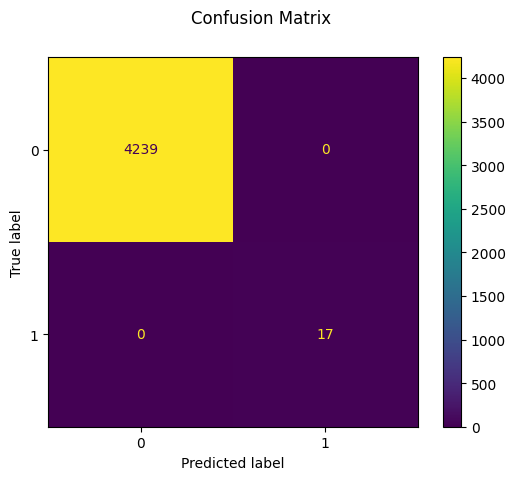

Classification report for classifier DecisionTreeClassifier(class_weight={0: 2.0, 1: 1.0},
                       min_impurity_decrease=0.0001, min_samples_split=20,
                       random_state=0):
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      4239
           1       1.00      1.00      1.00        17

    accuracy                           1.00      4256
   macro avg       1.00      1.00      1.00      4256
weighted avg       1.00      1.00      1.00      4256




In [ ]:
# latest, building and landuse

X = nominal_data[nominal_features]
y = nominal_data["official_type"]
weights = {0:2.0, 1:1.0}

# Split data into 80% train and 20% test subsets
X_train, X_test, y_train, y_test = train_test_split(\
    X, y, test_size=0.2, shuffle=True, stratify=y)
dt_split = DecisionTreeClassifier(class_weight=weights,min_samples_split=20, \
                                random_state=0,min_impurity_decrease = 0.0001)

#dt_split = DecisionTreeClassifier(min_samples_split=20, random_state=0,min_impurity_decrease = 0.0001)

# Learn on the train subset
dt_split.fit(X_train, y_train)

# Predict the target on the test subset
predicted = dt_split.predict(X_test)

# 1 = RES; 0 = NON_RES

disp = metrics.ConfusionMatrixDisplay.from_predictions(y_test, predicted)
disp.figure_.suptitle("Confusion Matrix")
print(f"Confusion matrix:\n{disp.confusion_matrix}")

plt.show()

print(
    f"Classification report for classifier {dt_split}:\n"
    f"{metrics.classification_report(y_test, predicted)}\n"
)

In [ ]:
print(y.value_counts())

official_type
0    21196
1       84
Name: count, dtype: int64


Confusion matrix:
[[21196     0]
 [    1    83]]


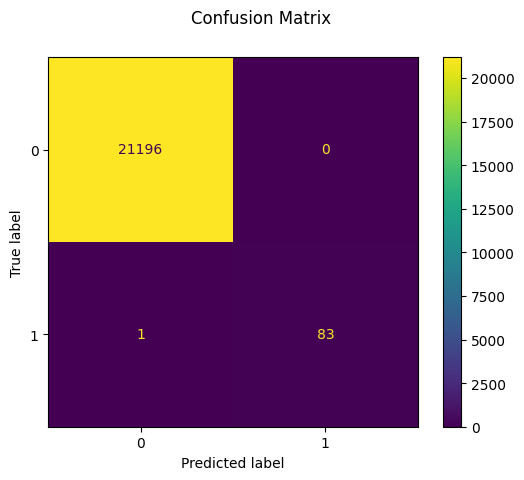

Classification report for classifier DecisionTreeClassifier(class_weight={0: 2.0, 1: 1.0},
                       min_impurity_decrease=0.0001, min_samples_split=20,
                       random_state=0):
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     21196
           1       1.00      0.99      0.99        84

    accuracy                           1.00     21280
   macro avg       1.00      0.99      1.00     21280
weighted avg       1.00      1.00      1.00     21280




In [ ]:
# result for generating output shape file

X = nominal_data[nominal_features]
y = nominal_data["official_type"]
#weights = 'balanced'
weights = {0:2.0, 1:1.0}
dt = DecisionTreeClassifier(class_weight=weights,min_samples_split=20, random_state=0,min_impurity_decrease = 0.0001)
y_pred = cross_val_predict(dt, X, y, cv=10)
disp = metrics.ConfusionMatrixDisplay.from_predictions(y, y_pred)
disp.figure_.suptitle("Confusion Matrix")
print(f"Confusion matrix:\n{disp.confusion_matrix}")

plt.show()

print(
    f"Classification report for classifier {dt}:\n"
    f"{metrics.classification_report(y, y_pred)}\n"
)

In [ ]:
output_data = nominal_data.copy()
output_data.drop(columns=['official_type','buffer_cat2_30', 'buffer_cat2_60','buffer_cat2_90'], inplace=True)
output_data.insert(1,'official',y)
output_data.insert(2,'predicted',y_pred)
output_filtered = output_data.copy()
#output_filtered = output_filtered[output_filtered['official'] != output_filtered['predicted']]
output_filtered['official'] = \
    output_filtered['official'].apply(lambda x: 'RES' if x == 1 else 'NON_RES')
output_filtered['predicted'] = \
    output_filtered['predicted'].apply(lambda x: 'RES' if x == 1 else 'NON_RES')

<Axes: >

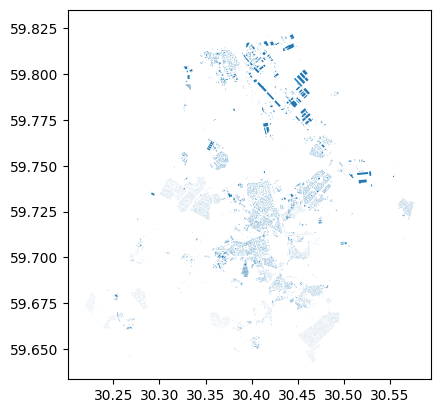

In [ ]:
output_data.plot()

<Axes: >

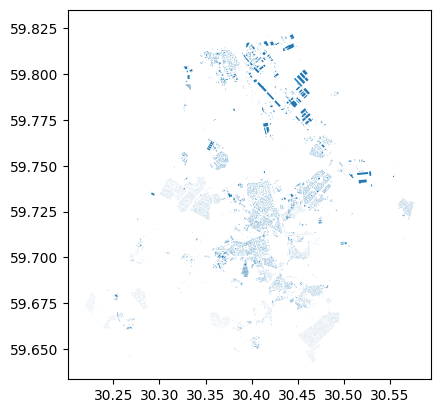

In [ ]:
output_filtered.plot()

In [ ]:
#output_filtered.to_file("./Datasets/OSM/Geopandas_Output/filtered_output.shp")
output_data.to_file("./Vasily_Predictions/Vasily_Predictions.shp")

/tmp/ipython-input-256-2638601212.py:2: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  output_data.to_file("./Vasily_Predictions/Vasily_Predictions.shp")


DataLayerError: Failed to create file Vasily_Predictions/Vasily_Predictions.shp: No such file or directory

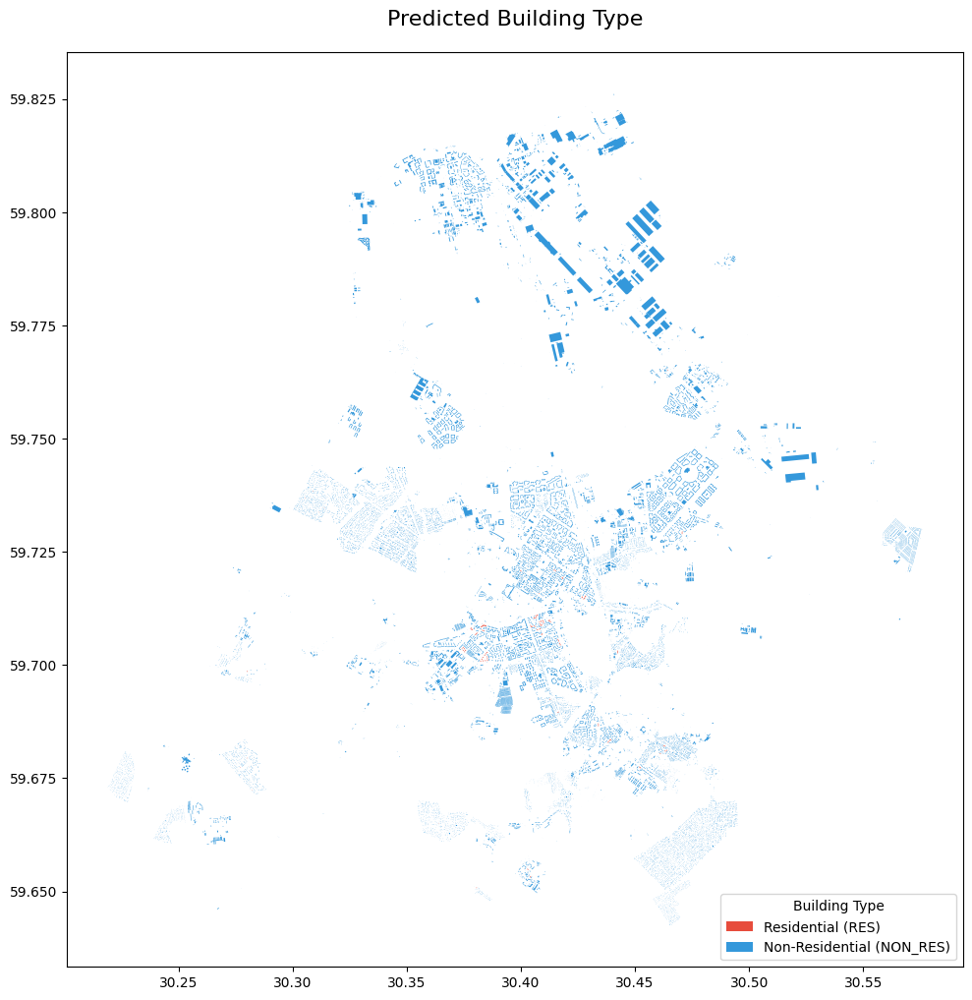

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.patches import Patch

# Define distinct colors for each category
color_mapping = {
    'RES': '#e74c3c' ,   # Red for non-residential
    'NON_RES': '#3498db' # Blue for residential
}

# Create a list of colors for each feature based on its category
colors = [color_mapping[cat] for cat in output_filtered['predicted']]

# Create the plot
ax = output_filtered.plot(color=colors, figsize=(10, 15))

# Create custom legend handles
legend_handles = [
    Patch(facecolor=color_mapping['RES'], label='Residential (RES)'),
    Patch(facecolor=color_mapping['NON_RES'], label='Non-Residential (NON_RES)')
]

# Add custom legend
ax.legend(handles=legend_handles, loc='lower right', title='Building Type', frameon=True)

# Add title
plt.title('Predicted Building Type', fontsize=16, pad=20)
plt.tight_layout()
plt.show()

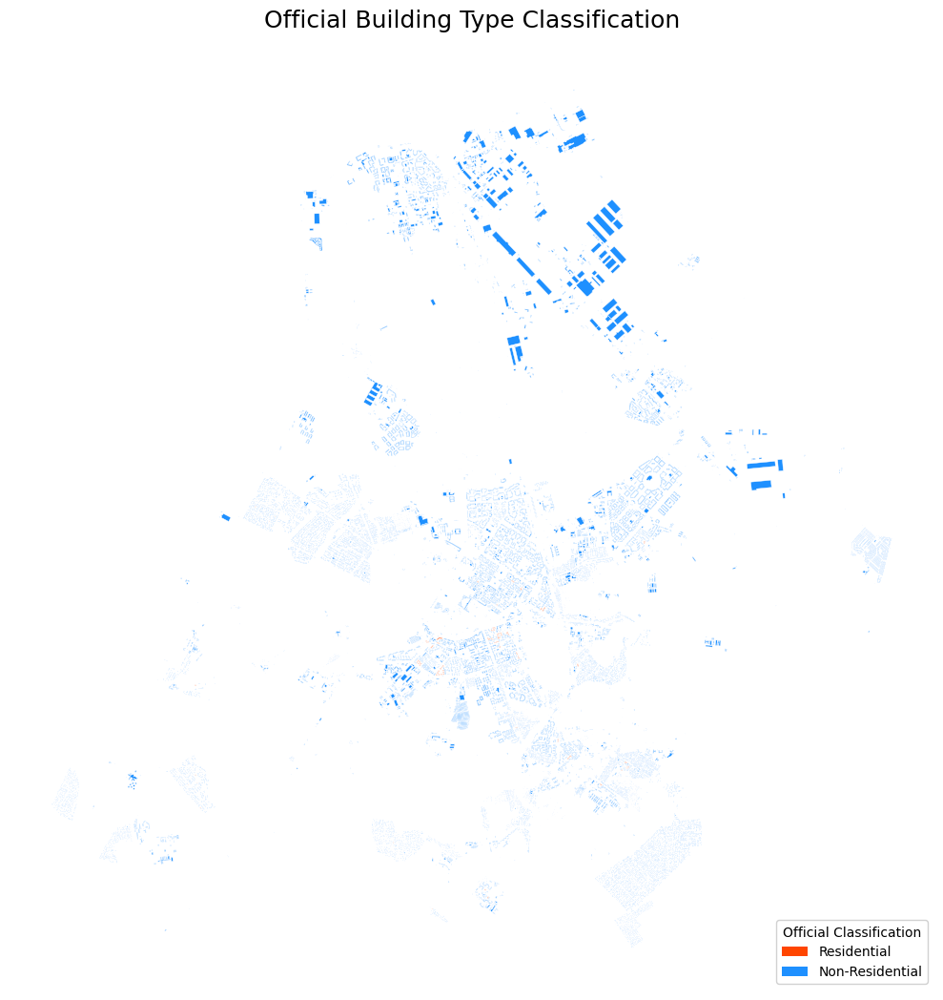

In [ ]:
# More distinctive colors
vibrant_colors = {
    'RES': '#FF4500',  # Orange-red for residential
    'NON_RES': '#1E90FF'  # Dodger blue for non-residential
}

# Create color list
colors = [vibrant_colors[cat] for cat in output_filtered['official']]

# Plot with enhanced styling
ax = output_filtered.plot(color=colors, figsize=(10, 15), linewidth=0.3, edgecolor='white')

# Add legend and title
legend = [
    Patch(facecolor=vibrant_colors['RES'], label='Residential'),
    Patch(facecolor=vibrant_colors['NON_RES'], label='Non-Residential')
]
ax.legend(handles=legend, title='Official Classification',
          loc='lower right', framealpha=0.9)

plt.title('Official Building Type Classification', fontsize=18, pad=15)
plt.axis('off')  # Cleaner look without axes
plt.tight_layout()
plt.show()

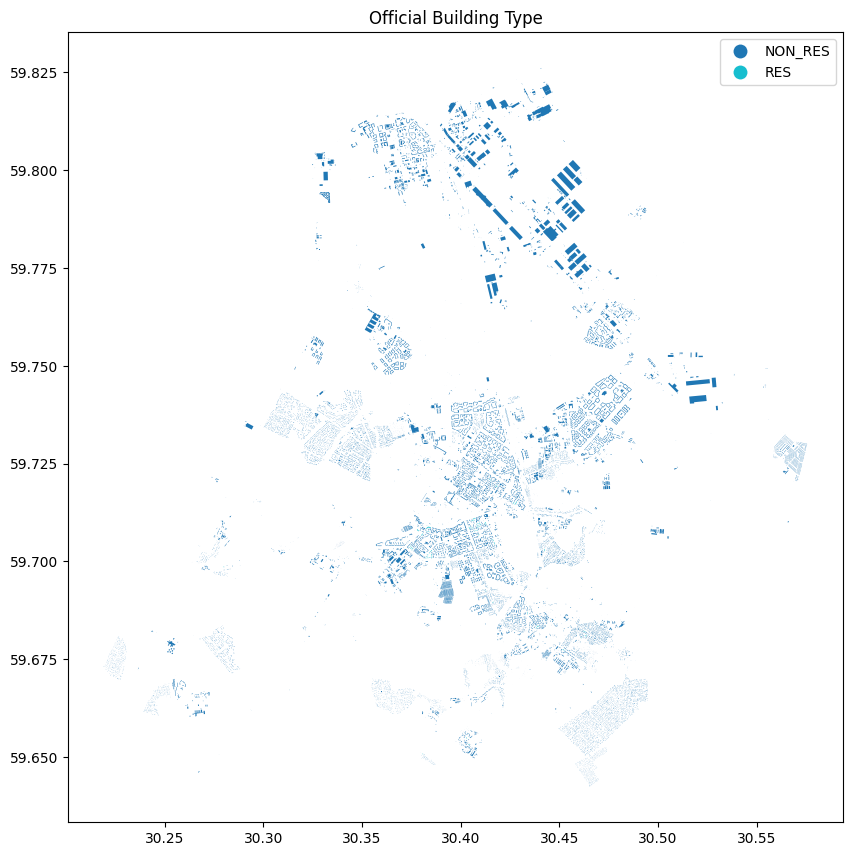

In [ ]:
output_filtered.plot(column='official', legend=True, figsize=(10, 15))
plt.title('Official Building Type')
plt.show()


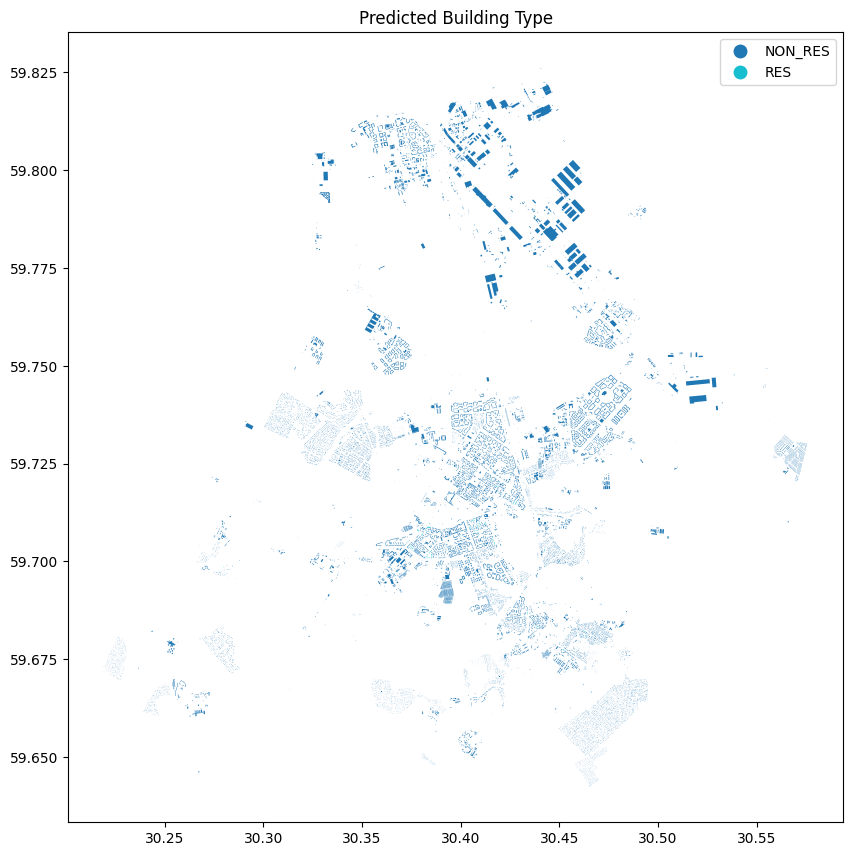

In [ ]:
output_filtered.plot(column='predicted', legend=True, figsize=(10, 15))
plt.title('Predicted Building Type')
plt.show()

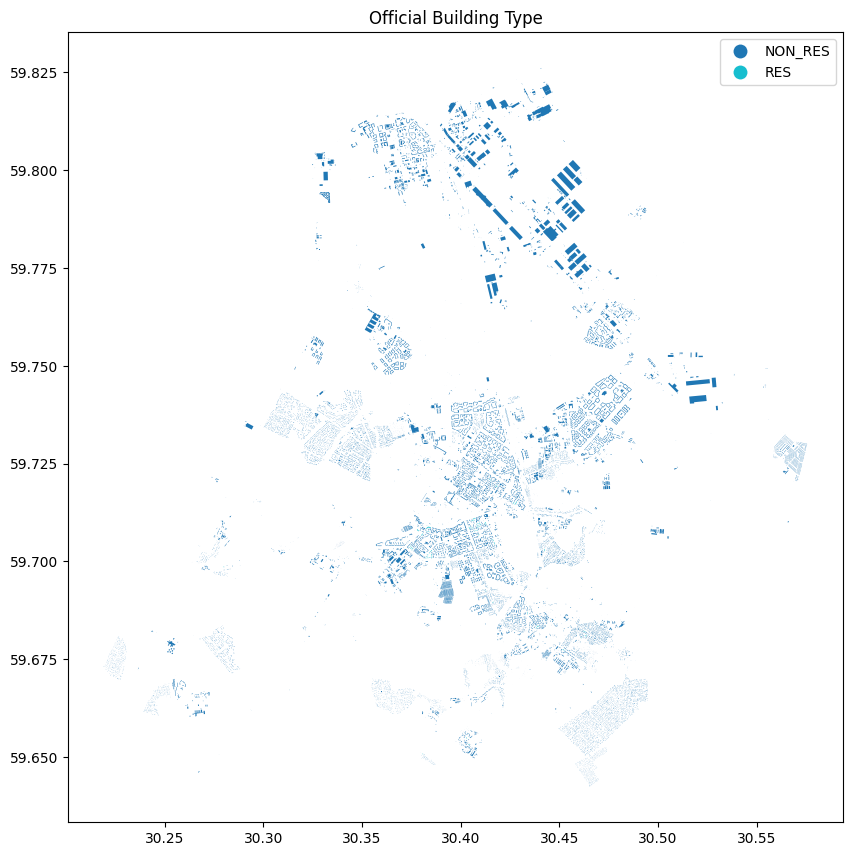

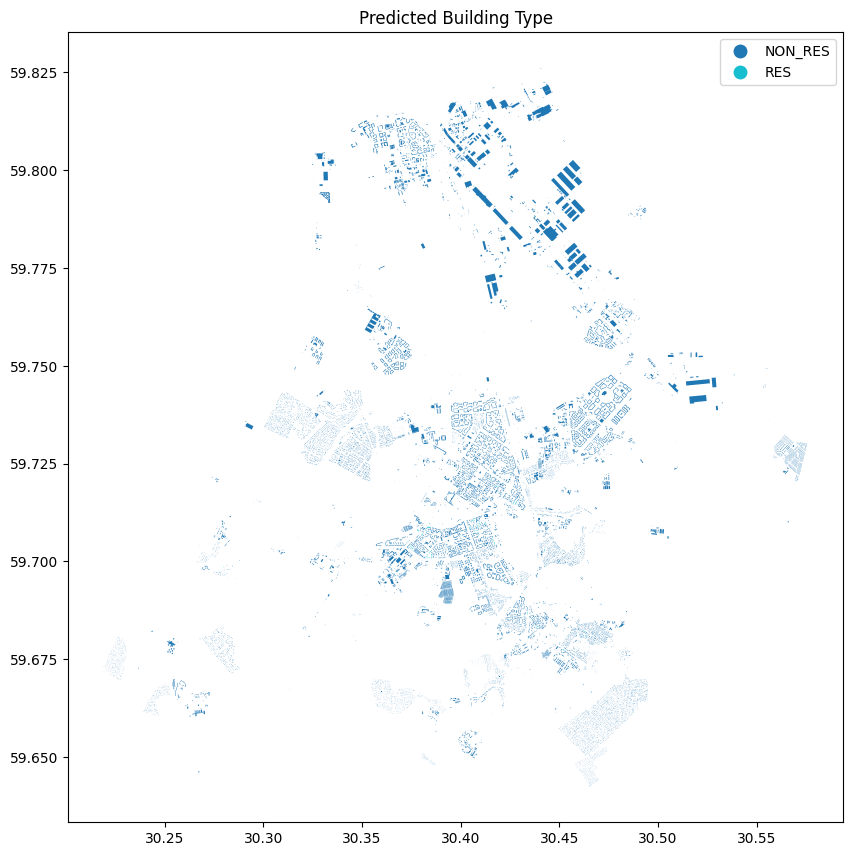

In [ ]:
output_filtered.plot(column='official', legend=True, figsize=(10, 15))
plt.title('Official Building Type')
plt.show()

output_filtered.plot(column='predicted', legend=True, figsize=(10, 15))
plt.title('Predicted Building Type')
plt.show()

output_filtered['match'] = (output_filtered['official'] == output_filtered['predicted'])
# output_filtered.explore(column='match', tiles='cartodbdarkmatter', legend=True, cmap='viridis', popup=['official','predicted', 'match'])

In [ ]:
# Ablation Study

In [ ]:
input_data.columns

Index(['geometry', 'official_type', 'buffer_cat1_30', 'buffer_cat1_60',
       'buffer_cat1_90', 'buffer_cat2_30', 'buffer_cat2_60', 'buffer_cat2_90',
       'buffer_cat3_30', 'buffer_cat3_60', 'buffer_cat3_90', 'buffer_cat4_30',
       'buffer_cat4_60', 'buffer_cat4_90', 'shop', 'website', 'brand',
       'amenity', 'building:levels', 'name', 'addr:street', 'source',
       'building', 'landuse', 'area', 'parking_cat1', 'parking_cat2',
       'parking_cat3', 'parking_cat4', 'parking_cat5', 'parking_cat6',
       'parking_cat7', 'parking_cat8', 'parking_cat9'],
      dtype='object')

In [ ]:
ablation_data = input_data.copy()

In [ ]:
ablation_data.drop(columns=['buffer_cat1_30', 'buffer_cat1_60',\
                        'buffer_cat1_90', 'buffer_cat2_30', 'buffer_cat2_60', 'buffer_cat2_90',\
                        'buffer_cat3_30', 'buffer_cat3_60', 'buffer_cat3_90', 'buffer_cat4_30',\
                        'buffer_cat4_60', 'buffer_cat4_90',\
                        \
                        \
                        'parking_cat1', 'parking_cat2', 'parking_cat3', 'parking_cat4',\
                        'parking_cat5', 'parking_cat6', 'parking_cat7', 'parking_cat8',\
                        'parking_cat9'], inplace=True)

In [ ]:
ablation_data.columns

Index(['geometry', 'official_type', 'shop', 'website', 'brand', 'amenity',
       'building:levels', 'name', 'addr:street', 'source', 'area',
       'apartments', 'church', 'civic', 'commercial', 'construction',
       'detached', 'dormitory', 'garage', 'garages', 'greenhouse', 'hospital',
       'hotel', 'house', 'industrial', 'kindergarten', 'misc_buildings',
       'office', 'parking', 'public', 'residential', 'retail', 'roof',
       'school', 'semidetached_house', 'service', 'shed', 'static_caravan',
       'terrace', 'warehouse', 'yes', 'cemetery_landuse',
       'construction_landuse', 'farmyard_landuse', 'forest_landuse',
       'misc_landuse', 'no_landuse', 'non_res_landuse', 'residential_landuse'],
      dtype='object')

In [ ]:
# nominal transform

value_tags = ['building','landuse']
#nominal_data = input_data.copy()
#value_tags = ['building']
ablation_data = nominal_transform(ablation_data, value_tags)
ablation_features = list(ablation_data.columns[2:])
ablation_features

KeyError: "None of [Index(['building'], dtype='object')] are in the [columns]"

In [ ]:
ablation_data.columns

In [ ]:
ablation_data.shape

In [ ]:
import pandas as pd
import numpy as np # Ensure numpy is imported
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn import metrics
import matplotlib.pyplot as plt

# Assume 'ablation_data' and 'ablation_features' are defined earlier in your code.
# For example, ablation_data might be loaded from a file or created through other processing.

# --- Clean 'building:levels' in ablation_data ---
# This step is crucial to ensure all data is numeric before training.
if 'building:levels' in ablation_data.columns:
    print("\nApplying cleaning to 'building:levels' in ablation_data...")
    # Convert 'building:levels' to numeric, coercing any errors (like '7;4;4') to NaN.
    ablation_data['building:levels'] = pd.to_numeric(ablation_data['building:levels'], errors='coerce')

    # Fill the NaN values with the median of the column.
    # The median is a robust choice for numerical features like counts.
    median_levels = ablation_data['building:levels'].median()
    ablation_data['building:levels'].fillna(median_levels, inplace=True)
    print(f"Filled NaN values in ablation_data['building:levels'] with median: {median_levels}")
else:
    print("\n'building:levels' column not found in ablation_data. Skipping cleaning for this column.")

# --- End of cleaning step ---


# Data Selection
X = ablation_data[ablation_features]
y = ablation_data["official_type"]
weights = {0:2.0, 1:1.0}

# Split data into 80% train and 20% test subsets
X_train, X_test, y_train, y_test = train_test_split(\
    X, y, test_size=0.2, shuffle=True)

# Decision Tree Classifier Initialization
dt_split = DecisionTreeClassifier(class_weight=weights,min_samples_split=20, \
                                random_state=0,min_impurity_decrease = 0.0001)

# Learn on the train subset
dt_split.fit(X_train, y_train)

# Predict the target on the test subset
predicted = dt_split.predict(X_test)

# 1 = RES; 0 = NON_RES (Class Labels)

# Display Confusion Matrix
disp = metrics.ConfusionMatrixDisplay.from_predictions(y_test, predicted)
disp.figure_.suptitle("Confusion Matrix")
print(f"Confusion matrix:\n{disp.confusion_matrix}")

plt.show()

# Display Classification Report
print(
    f"Classification report for classifier {dt_split}:\n"
    f"{metrics.classification_report(y_test, predicted)}\n"
)

In [ ]:
X = ablation_data[ablation_features]
y = ablation_data["official_type"]
weights = {0:2.0, 1:1.0}

# Split data into 80% train and 20% test subsets
X_train, X_test, y_train, y_test = train_test_split(\
    X, y, test_size=0.2, shuffle=True)
dt_split = DecisionTreeClassifier(class_weight=weights,min_samples_split=20, \
                                random_state=0,min_impurity_decrease = 0.0001)

#dt_split = DecisionTreeClassifier(min_samples_split=20, random_state=0,min_impurity_decrease = 0.0001)

# Learn on the train subset
dt_split.fit(X_train, y_train)

# Predict the target on the test subset
predicted = dt_split.predict(X_test)

# 1 = RES; 0 = NON_RES

disp = metrics.ConfusionMatrixDisplay.from_predictions(y_test, predicted)
disp.figure_.suptitle("Confusion Matrix")
print(f"Confusion matrix:\n{disp.confusion_matrix}")

plt.show()

print(
    f"Classification report for classifier {dt_split}:\n"
    f"{metrics.classification_report(y_test, predicted)}\n"
)

In [ ]:
print(y_test.value_counts())